# Project 1: Analysis and Forecasting of NYC Taxi Rides
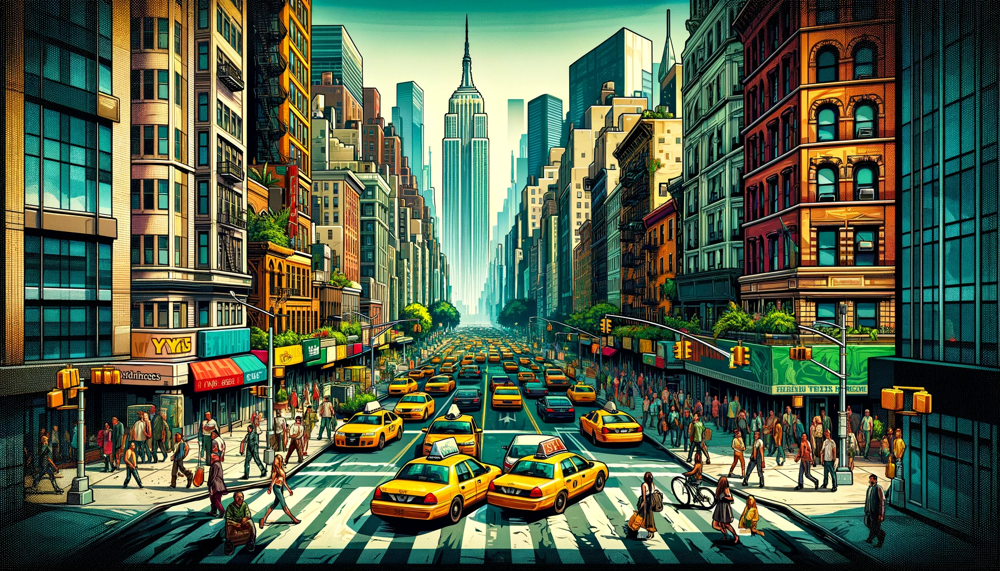

In [1]:
import sys
import os

# Define the absolute path to the "Group 8" directory on your Desktop
group_8_path = os.path.expanduser("~/Desktop/Group 8")

# Add it to sys.path if not already there
if group_8_path not in sys.path:
    sys.path.append(group_8_path)

# Check if the "src" folder exists
src_path = os.path.join(group_8_path, "src")
if not os.path.exists(src_path):
    print(f"⚠️ Warning: The directory 'src' was not found in {group_8_path}")
else:
    print(f"✅ 'src' found in {group_8_path}")

# Ensure src directory exists
if not os.path.exists(src_path):
    os.makedirs(src_path)
    print(f"🛠 Created missing directory {src_path}")

# Ensure __init__.py exists in src
init_file = os.path.join(src_path, "__init__.py")
if not os.path.exists(init_file):
    open(init_file, 'w').close()  # Create an empty __init__.py file
    print(f"🛠 Created missing __init__.py in {src_path}")
else:
    print(f"✅ '__init__.py' exists in {src_path}")

# Reload autoreload extension and import src
%reload_ext autoreload
%autoreload 2

# Try importing src
try:
    import src
    print("🎉 Successfully imported 'src'!")
except ModuleNotFoundError:
    print("❌ Error: Could not import 'src'. Make sure it exists and contains an __init__.py file.")


✅ 'src' found in /Users/amalielundorff/Desktop/Group 8
✅ '__init__.py' exists in /Users/amalielundorff/Desktop/Group 8/src
🎉 Successfully imported 'src'!


### Task 1: Understanding the Data
This task explores NYC taxi trip records, including timestamps, locations, distances, fares, and payment methods. The data is collected by authorized providers for the NYC Taxi & Limousine Commission (TLC).

In [2]:
import pandas as pd
import gdown

# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = "https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing"

# Define the months and year for analysis
months = ['06', '07']
year = '2021'

# Initialize empty lists to store DataFrames
df_yellow_list = []
df_green_list = []

# Function to load data from Google Drive
def load_data_from_google_drive(url):
    file_id = url.split('/d/')[1].split('/')[0]
    output = 'taxi_zone_lookup.csv'
    gdown.download(f'https://drive.google.com/uc?id={file_id}', output, quiet=False)
    return pd.read_csv(output)

# Load and concatenate taxi data from URLs
for month in months:
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))

    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Defining the dataframe for Yellow and Green taxis
df_yellow = pd.concat(df_yellow_list)
df_green = pd.concat(df_green_list)

# Defining datafram for df_zones (Taxi zones)
df_zones = load_data_from_google_drive(url=zones_url)

Downloading...
From: https://drive.google.com/uc?id=12VgjWXkyEBsxzuKFxIkAevEbao85ei0T
To: /Users/amalielundorff/Desktop/Group 8 /taxi_zone_lookup.csv
100%|██████████| 26.5k/26.5k [00:00<00:00, 33.0MB/s]


Below codes kis used to illustrate the first 5 rows from the data within the yellow taxis. 

In [3]:
df_yellow.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2021-06-01 00:13:26,2021-06-01 00:17:14,1.0,0.90,1.0,N,186,50,1,5.0,3.00,0.5,2.20,0.00,0.3,11.00,2.5,0.00
1,1,2021-06-01 00:32:23,2021-06-01 01:07:04,1.0,23.00,1.0,N,132,18,2,61.5,1.75,0.5,0.00,6.55,0.3,70.60,0.0,1.25
2,1,2021-06-01 00:12:15,2021-06-01 00:15:28,0.0,0.90,1.0,N,138,70,2,5.0,1.75,0.5,0.00,0.00,0.3,7.55,0.0,1.25
3,1,2021-06-01 00:35:00,2021-06-01 00:53:17,0.0,11.20,1.0,N,138,189,1,31.5,1.75,0.5,8.50,0.00,0.3,42.55,0.0,1.25
4,2,2021-06-01 00:31:01,2021-06-01 00:52:27,1.0,9.49,1.0,N,138,142,1,28.5,0.50,0.5,7.77,6.55,0.3,47.87,2.5,1.25


Below codes kis used to illustrate the first 5 rows from the data within the green taxis. 

In [4]:
df_green.head(5)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2021-06-01 00:31:19,2021-06-01 00:42:14,N,5.0,168,235,2.0,4.89,15.0,0.0,0.0,4.59,0.0,None,0.3,19.89,1.0,2.0,0.0
1,2,2021-06-01 00:16:07,2021-06-01 00:24:13,N,1.0,82,7,1.0,1.44,7.5,0.5,0.5,0.00,0.0,None,0.3,8.80,2.0,1.0,0.0
2,1,2021-06-01 00:03:58,2021-06-01 00:21:20,N,1.0,244,74,1.0,2.30,13.5,0.5,0.5,0.00,0.0,None,0.3,14.80,2.0,1.0,0.0
3,2,2021-06-01 00:00:57,2021-06-01 00:03:19,N,1.0,254,254,1.0,0.86,4.5,0.5,0.5,0.00,0.0,None,0.3,5.80,2.0,1.0,0.0
4,2,2021-06-01 00:33:22,2021-06-01 00:56:17,N,1.0,127,174,4.0,3.82,18.5,0.5,0.5,0.00,0.0,None,0.3,19.80,1.0,1.0,0.0


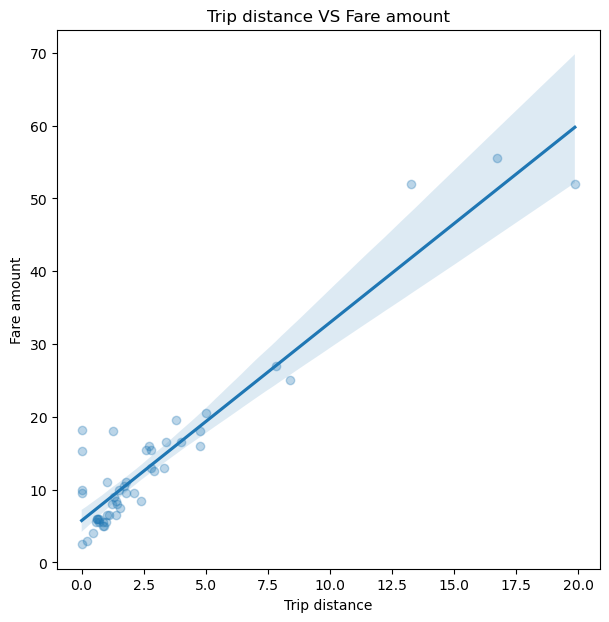

In [5]:
from src.utils import create_scatterplot

create_scatterplot(
    df_yellow.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'Trip distance VS Fare amount', 
    xlabel = 'Trip distance',
    ylabel = 'Fare amount',
)

This scatter plot shows a strong positive correlation between trip distance and fare amount, indicating that longer trips result in higher fares. The regression line confirms a linear trend, with the shaded area representing the confidence interval.

### Task 2: Exploratory Data Analysis
This task focuses on analyzing the dataset to identify patterns and relationships between key variables such as trip distance, fare amount, and passenger count. By examining distributions and detecting potential outliers, the goal is to assess data quality and determine whether any impractical values should be excluded.

The command below "pip install pyarrow fastparquet" installs PyArrow and Fastparquet, libraries for handling Parquet files in Python. The output confirms successful installation, with a note to restart the kernel for updates to take effect.

In [6]:
pip install pyarrow fastparquet 

Note: you may need to restart the kernel to use updated packages.


In [7]:
import pyarrow
print("PyArrow is installed successfully!")

PyArrow is installed successfully!


The codes above "PyArrow and Fastparquet" are installed because Pandas requires them to read Parquet files. Without these libraries, loading the NYC taxi data is not possible, preventing the analysis.

The below codes loads yellow and green taxi trip data for June and July 2021, reads Parquet files, merges the data, and displays the first rows for verification.

In [8]:
import pandas as pd

# Define the months and year to analyze
months = ['06', '07'] # June and July
year = '2021'

# Define base URLs for yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"

# Create empty lists to store data 
df_yellow_list = []
df_green_list = []

# Load the data for each month
for month in months: 
    yellow_data_url= base_url_yellow.format(year=year, month=month)
    green_data_url = base_url_green.format(year=year, month=month)

    # Read Parquet files using pyarrow
    dfy= pd.read_parquet(yellow_data_url, engine='pyarrow')
    dfg= pd.read_parquet(green_data_url, engine='pyarrow')

    # Append data to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate all months into a single DataFrame
df_yellow = pd.concat(df_yellow_list, ignore_index=True)
df_green = pd.concat(df_green_list, ignore_index=True)

# Verify Loading 
df_yellow.head(), df_green.head()

(   VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
 0         1  2021-06-01 00:13:26   2021-06-01 00:17:14              1.0   
 1         1  2021-06-01 00:32:23   2021-06-01 01:07:04              1.0   
 2         1  2021-06-01 00:12:15   2021-06-01 00:15:28              0.0   
 3         1  2021-06-01 00:35:00   2021-06-01 00:53:17              0.0   
 4         2  2021-06-01 00:31:01   2021-06-01 00:52:27              1.0   
 
    trip_distance  RatecodeID store_and_fwd_flag  PULocationID  DOLocationID  \
 0           0.90         1.0                  N           186            50   
 1          23.00         1.0                  N           132            18   
 2           0.90         1.0                  N           138            70   
 3          11.20         1.0                  N           138           189   
 4           9.49         1.0                  N           138           142   
 
    payment_type  fare_amount  extra  mta_tax  tip_amount  t

The NYC taxi trip data for June and July 2021 has been loaded and verified using Parquet files. The output confirms that the Yellow Taxi data includes key details such as pickup/drop-off times, trip distances, fares, and passenger counts. However, some trips have zero passengers, indicating potential data issues.

This step ensures that the data is correctly structured before analysis, allowing early detection of anomalies. The next step involves cleaning the data by removing invalid values (e.g., passenger_count = 0) and proceeding with data visualization to analyze trip trends.

In [9]:
# Inspecting the Data for yellow taxi
df_yellow[['trip_distance', 'fare_amount', 'passenger_count']].describe()

,trip_distance,fare_amount,passenger_count
count,5.656010e+06,5.656010e+06,5.401816e+06
mean,7.359018e+00,1.345321e+01,1.448965e+00
std,7.176371e+02,1.253714e+01,1.060095e+00
min,0.000000e+00,-6.240000e+02,0.000000e+00
25%,1.100000e+00,6.500000e+00,1.000000e+00
50%,1.850000e+00,9.500000e+00,1.000000e+00
75%,3.350000e+00,1.500000e+01,2.000000e+00
max,3.053976e+05,1.320000e+03,9.000000e+00


In [10]:
# Inspecting the Data for green taxi
df_green[['trip_distance', 'fare_amount', 'passenger_count']].describe()

,trip_distance,fare_amount,passenger_count
count,170428.000000,170428.000000,105614.000000
mean,197.870668,20.131211,1.294895
std,4657.229610,15.505448,0.974816
min,0.000000,-150.000000,0.000000
25%,1.340000,9.000000,1.000000
50%,2.670000,16.000000,1.000000
75%,5.970000,26.140000,1.000000
max,314199.070000,728.500000,48.000000


In [11]:
# Checking that the data is correct for the yellow taxis
print("First 5 rows of df_yellow:")
print(df_yellow.head())

# Checking that the data is correct for the green taxis
print("\nFirst 5 rows of df_green:")
print(df_green.head())

First 5 rows of df_yellow:
   VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0         1  2021-06-01 00:13:26   2021-06-01 00:17:14              1.0   
1         1  2021-06-01 00:32:23   2021-06-01 01:07:04              1.0   
2         1  2021-06-01 00:12:15   2021-06-01 00:15:28              0.0   
3         1  2021-06-01 00:35:00   2021-06-01 00:53:17              0.0   
4         2  2021-06-01 00:31:01   2021-06-01 00:52:27              1.0   

   trip_distance  RatecodeID store_and_fwd_flag  PULocationID  DOLocationID  \
0           0.90         1.0                  N           186            50   
1          23.00         1.0                  N           132            18   
2           0.90         1.0                  N           138            70   
3          11.20         1.0                  N           138           189   
4           9.49         1.0                  N           138           142   

   payment_type  fare_amount  extra  mta_tax  t

The input shows the first 5 rows of df_yellow, but df_green is missing from the output. 

Therefore df_green will be printed seperately: 

In [12]:
# Above the green taxi data didn't load correctly, so we will try loading it again.
print("First 5 rows of df_green:")
print(df_green.head(10))

First 5 rows of df_green:
   VendorID lpep_pickup_datetime lpep_dropoff_datetime store_and_fwd_flag  \
0         2  2021-06-01 00:31:19   2021-06-01 00:42:14                  N   
1         2  2021-06-01 00:16:07   2021-06-01 00:24:13                  N   
2         1  2021-06-01 00:03:58   2021-06-01 00:21:20                  N   
3         2  2021-06-01 00:00:57   2021-06-01 00:03:19                  N   
4         2  2021-06-01 00:33:22   2021-06-01 00:56:17                  N   
5         2  2021-06-01 00:11:06   2021-06-01 00:14:52                  N   
6         2  2021-06-01 00:07:14   2021-06-01 00:07:19                  N   
7         2  2021-06-01 00:32:05   2021-06-01 00:38:11                  N   
8         2  2021-06-01 00:48:25   2021-06-01 00:54:35                  N   
9         2  2021-06-01 00:30:03   2021-06-01 00:41:10                  N   

   RatecodeID  PULocationID  DOLocationID  passenger_count  trip_distance  \
0         5.0           168           235        

With the green taxi data successfully loaded, the distribution of trip distances for Yellow and Green taxis can be visualized using histograms with Seaborn.

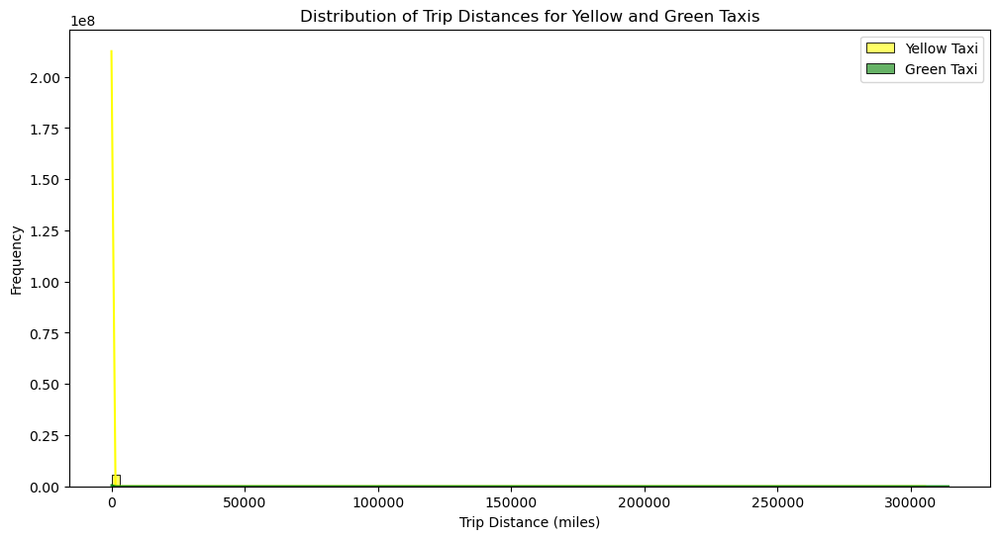

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
    # Defines a large plot for better visualization

sns.histplot(df_yellow['trip_distance'], bins=100, color='yellow', kde=True, alpha=0.6, label='Yellow Taxi')
sns.histplot(df_green['trip_distance'], bins=100, color='green', kde=True, alpha=0.6, label='Green Taxi')
    # Plots Yellow and Green taxi trip distances with 50 bins and smoothed curve for distribution. 

plt.xlabel('Trip Distance (miles)')
      # Defines x-axis label
plt.ylabel('Frequency')
        # Defines y-axis label
    
plt.title('Distribution of Trip Distances for Yellow and Green Taxis')
    # Defines title of the plot
    
plt.legend()
    # Displays legend
plt.show()
    # Displays the plot

To optimize the plot, the background is changed to black, making the data appear stronger due to contrast.

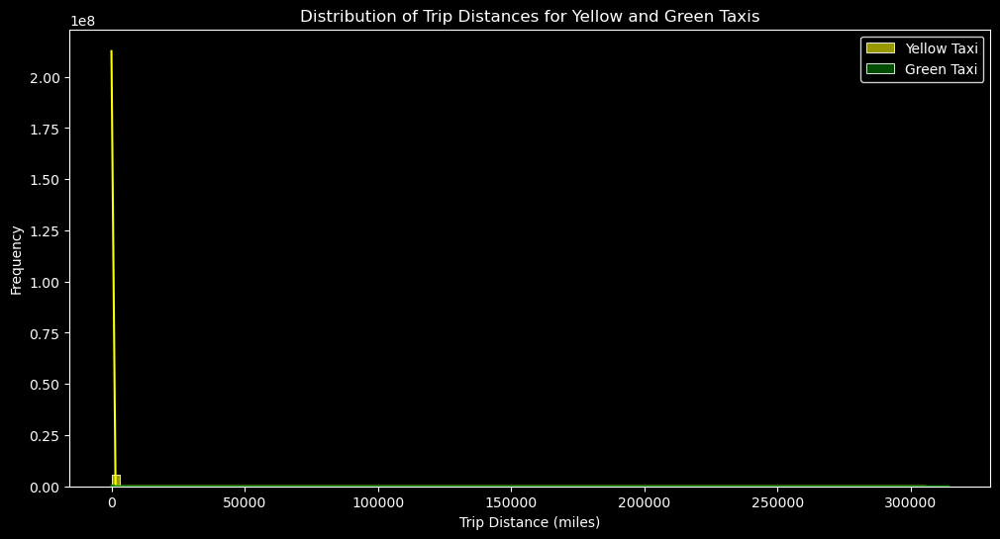

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the background to black
plt.style.use('dark_background')

plt.figure(figsize=(12, 6))  # Define figure size

# Plot histograms with visible edges
sns.histplot(df_yellow['trip_distance'], bins=100, color='yellow', kde=True, alpha=0.6, label='Yellow Taxi', edgecolor='white')
sns.histplot(df_green['trip_distance'], bins=100, color='green', kde=True, alpha=0.6, label='Green Taxi', edgecolor='white')

# Set axis labels and title with white text
plt.xlabel('Trip Distance (miles)', color='white')
plt.ylabel('Frequency', color='white')
plt.title('Distribution of Trip Distances for Yellow and Green Taxis', color='white')

# Change tick colors to white for better contrast
plt.xticks(color='white')
plt.yticks(color='white')

# Customize legend with a black background and white text
plt.legend(facecolor='black', edgecolor='white', labelcolor='white')

plt.show()  # Display the plot


The current histogram attempts to visualize the distribution of trip distances for yellow and green taxis, but it is not sufficient for a meaningful analysis due to the presence of extreme outliers. The x-axis extends to distances over 300,000 miles, which is completely unrealistic for taxi trips. This suggests that there are data errors or extreme outliers that need to be filtered out before drawing any conclusions. 

Additionally, the majority of trip distances appear to be clustered near zero, but because of the scale of the graph, it is difficult to see the actual distribution of normal trips.

The histograms appears heavily skewed this could be because the dataset contains extreme outliers in trip distances, likely in the tens or hundreds of thousands of miles. These extreme values compress the scale, making the majority of the data with shorter trips appear as a single vertical line near zero. 




In [15]:
# Plotting the distribution of trip distances for yellow taxis
df_yellow[['trip_distance', 'fare_amount', 'passenger_count']].describe()

,trip_distance,fare_amount,passenger_count
count,5.656010e+06,5.656010e+06,5.401816e+06
mean,7.359018e+00,1.345321e+01,1.448965e+00
std,7.176371e+02,1.253714e+01,1.060095e+00
min,0.000000e+00,-6.240000e+02,0.000000e+00
25%,1.100000e+00,6.500000e+00,1.000000e+00
50%,1.850000e+00,9.500000e+00,1.000000e+00
75%,3.350000e+00,1.500000e+01,2.000000e+00
max,3.053976e+05,1.320000e+03,9.000000e+00


In [16]:
# Plotting the distribution of trip distances for green taxis
df_green[['trip_distance', 'fare_amount', 'passenger_count']].describe()

,trip_distance,fare_amount,passenger_count
count,170428.000000,170428.000000,105614.000000
mean,197.870668,20.131211,1.294895
std,4657.229610,15.505448,0.974816
min,0.000000,-150.000000,0.000000
25%,1.340000,9.000000,1.000000
50%,2.670000,16.000000,1.000000
75%,5.970000,26.140000,1.000000
max,314199.070000,728.500000,48.000000


The distorted histogram aligns with the summary statistics shown in describe() from above. 

The extreme max values in trip_distance explains why the histogram is skewed: 

**Yellow Taxi:**

Max trip distance: 305,397 miles (clearly unrealistic)

Mean trip distance: 7.36 miles

Standard deviation (std): 717.64, which is extremely high

Min trip distance: 0 miles (invalid data)

**Green Taxi:**

Max trip distance: 314,199 miles (another extreme outlier)

Mean trip distance: 197.87 miles (inflated due to outliers)

Standard deviation (std): 4,657 miles (way too large)

Min trip distance: 0 miles

The extreme max values 300,000+ miles strech the x-axis, making most trips 0-10 miles appear as a single compressed bar. The mean trip distances are reasonable, but the huge standard deviation suggest outliers.

The negative fares -150 and trip_distance = 0 also indicate data issues. 

To visualize extreme outliers a boxplot is created. 

The plot is used:

1. To identify and visualize outliers that may distort analysis.
2. To confirm the need for data cleaning before further exploration.
3. To compare trip distance patterns between Yellow and Green taxis.

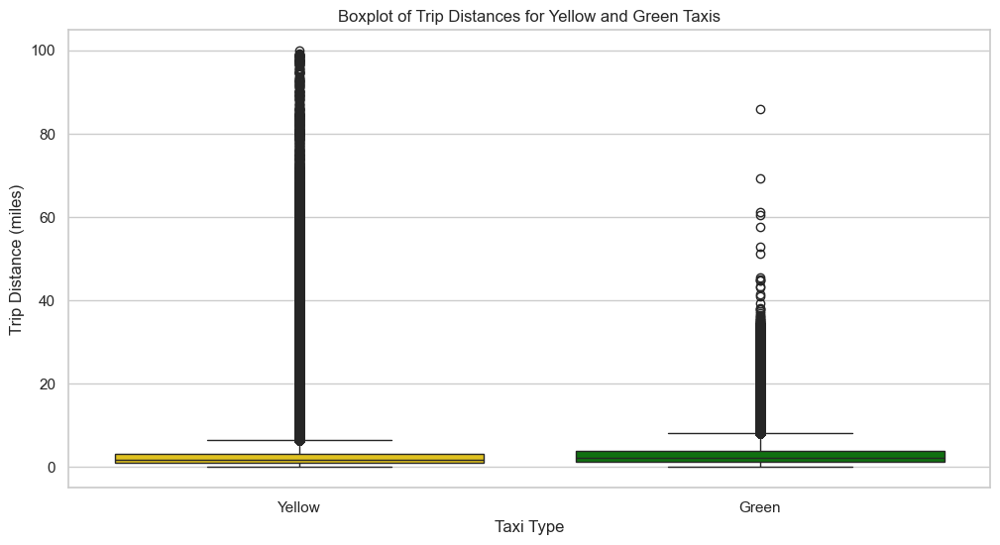

In [ ]:
# Before plotting the datasets is combined 

import pandas as pd
import matplotlib.pyplot as plt

# Codes to rerun the data loading process **seaborncode**
import seaborn as sns
sns.set_theme(style="whitegrid")  # Change to a light background


# Combining trip distances into a single DataFrame with labels 
df_boxplot = pd.DataFrame({
    'Trip Distance': pd.concat([df_yellow['trip_distance'], df_green['trip_distance']], ignore_index=True),
    'Taxi Type': ['Yellow'] * len(df_yellow) + ['Green'] * len(df_green) 
})
    # Combines trip distances of Yellow and Green taxis into a single DataFrame with labels

# Plotting the boxplot
plt.figure(figsize=(12, 6))
    # Defines a large plot for better visualization
sns.boxplot(
    x='Taxi Type', 
    y='Trip Distance', 
    data=df_boxplot, 
    hue='Taxi Type',  # Assign hue to differentiate colors
    palette={'Yellow': '#FFD700', 'Green': '#008000'},  # Yellow and Green colors
    legend=False)

# Labels and title
plt.xlabel('Taxi Type')
    # Defines x-axis label
plt.ylabel('Trip Distance (miles)')
    # Defines y-axis label
plt.title('Boxplot of Trip Distances for Yellow and Green Taxis')
    # Defines title of the plot

plt.show()
    # Displays the plot


The boxplot reveals extreme outliers in both Yellow and Green taxi trip distances, with some exceeding 300,000 miles, which is somewhat unrealistic. Most valid trips are clustered at the lower end (0-10 miles), but the extreme values inflate the scale, making it difficult to see the true distribution.

To make the analysis more meaningful, extreme outliers are removed, and the boxplot is re-run with a realistic range (e.g., 0-100 miles) to accurately interpret trip patterns.

The majority of data points are clustered near the bottom, while a significant number of extreme values extend beyond 300,000 miles, indicating likely data errors. Since the whiskers are barely visible due to these outliers, the data will be filtered using the interquartile range (IQR) to remove unrealistic trip distances.

**IQR filtering**

In [18]:
import pandas as pd

# Define a function to filter outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile (25th percentile)
    Q3 = df[column].quantile(0.75)  # Third quartile (75th percentile)
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR  # Lower bound
    upper_bound = Q3 + 1.5 * IQR  # Upper bound

    # Filter out extreme values
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply IQR filtering to both datasets
df_yellow_filtered = remove_outliers_iqr(df_yellow, 'trip_distance')
df_green_filtered = remove_outliers_iqr(df_green, 'trip_distance')

# Print how many outliers were removed
print(f"Original Yellow Taxi trips: {len(df_yellow)}, After IQR filtering: {len(df_yellow_filtered)}")
print(f"Original Green Taxi trips: {len(df_green)}, After IQR filtering: {len(df_green_filtered)}")


Original Yellow Taxi trips: 5656010, After IQR filtering: 5028545
Original Green Taxi trips: 170428, After IQR filtering: 156173


The code successfully applies Interquartile Range (IQR) filtering to remove extreme outliers from the trip_distance column for both yellow and green taxi datasets. The results show that a significant number of trips were identified as outliers and removed:

**Yellow Taxi Trips:**

Before filtering: 5,650,610

After IQR filtering: 5,028,545

Outliers removed: 622,065 (11% of data)




**Green Taxi Trips:**

Before filtering: 170,428

After IQR filtering: 156,173

Outliers removed: 14,255 (8% of data)

**Analyzing of relationsship between distance and fare amount**

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


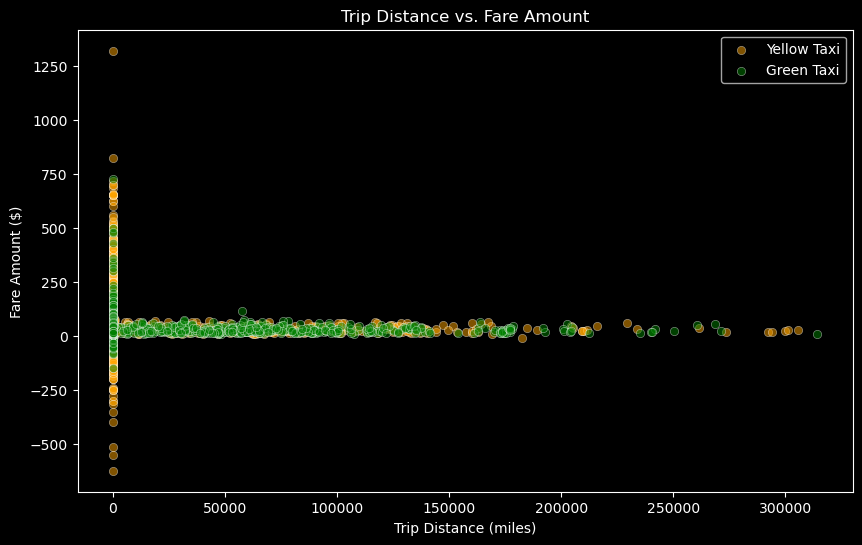

In [19]:
# Analyzing the relationship between trip distance and fare amount
    # Scatter Plot of distance VS fare amount for Yellow and Green taxis

plt.figure(figsize=(10, 6))
    # Defines a large plot for better visualization
sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['fare_amount'], alpha=0.5, color="orange", label="Yellow Taxi")
sns.scatterplot(x=df_green['trip_distance'], y=df_green['fare_amount'], alpha=0.5, color="green", label="Green Taxi")
    # Plots: Scatter plot of trip distance vs fare amount for Yellow and Green taxis with respective colors

plt.xlabel('Trip Distance (miles)')
    # Defines x-axis label
plt.ylabel('Fare Amount ($)')
    # Defines y-axis label
plt.title('Trip Distance vs. Fare Amount')
    # Defines title of the plot
plt.legend()
    # Displays legend
plt.show()
    # Displays the plot

The scatter plot shows extreme outliers, with trip distances exceeding 250,000 miles and some negative or highly inflated fares. While fares generally increase with trip distance, these outliers distort the trend.

However, this scatter plot seems illogical because it shows trip distances exceeding 50,000 miles while fares remain close to $0, which is impossible in a real-world taxi scenario. A ride of that length should cost thousands of dollars, not near zero. 

Additionally, the presence of negative fares—which should only occur due to errors or refunds—further indicates data inconsistencies. Many long-distance trips also appear with zero or very low fares, which doesn't align with expected pricing patterns. These inconsistencies suggest that some data points are corrupted or misrecorded.

To determine whether the illogical scatter plots were caused by incorrect data loading, the dataset was verified by checking sample values and data types.

In [20]:
# Check if trip distances and fare amounts align properly
print(df_yellow[['trip_distance', 'fare_amount']].head(50))

    trip_distance  fare_amount
0            0.90          5.0
1           23.00         61.5
2            0.90          5.0
3           11.20         31.5
4            9.49         28.5
5            9.30         27.5
6            6.72         25.0
7            9.48         26.0
8            5.25         18.5
9            1.74          8.0
10          21.60         52.0
11           4.30         14.0
12          13.16         43.0
13           1.17          5.5
14          19.80         53.5
15           0.90          5.0
16           4.40         14.5
17           4.51         16.5
18           7.79         24.5
19           7.80         32.5
20           8.81         25.5
21           1.13          5.0
22           1.55          8.5
23           0.20          3.0
24           2.86         13.0
25          20.80         52.0
26           3.91         14.0
27           0.40          3.5
28           4.90         15.5
29          15.10         41.5
30           8.50         24.0
31      

In [21]:
# Check if trip distances and fare amounts for the first 30 rows
print(df_green[['trip_distance', 'fare_amount']].head(50))

    trip_distance  fare_amount
0            4.89         15.0
1            1.44          7.5
2            2.30         13.5
3            0.86          4.5
4            3.82         18.5
5            0.47          4.0
6            0.00          2.5
7            1.81          7.5
8            1.42          7.0
9            2.56         11.0
10           5.24         21.5
11          20.57         60.5
12          20.72         56.5
13          22.12         62.5
14           2.65          9.5
15           4.99         16.5
16           1.65          7.5
17           1.34          8.0
18           6.09         21.0
19           1.68          7.5
20           1.79          9.5
21           0.60          4.5
22          25.44         70.0
23           0.64          4.5
24           4.12         13.0
25           8.32         51.5
26           2.91         10.0
27           2.33         11.5
28           3.94         13.5
29           1.64          7.5
30           0.00        100.0
31      

The following codes displays the data types of columns in df_yellow and df_green.

In [22]:
print(df_yellow.dtypes)
print(df_green.dtypes)

VendorID                          int64
tpep_pickup_datetime     datetime64[us]
tpep_dropoff_datetime    datetime64[us]
passenger_count                 float64
trip_distance                   float64
RatecodeID                      float64
store_and_fwd_flag               object
PULocationID                      int64
DOLocationID                      int64
payment_type                      int64
fare_amount                     float64
extra                           float64
mta_tax                         float64
tip_amount                      float64
tolls_amount                    float64
improvement_surcharge           float64
total_amount                    float64
congestion_surcharge            float64
airport_fee                     float64
dtype: object
VendorID                          int64
lpep_pickup_datetime     datetime64[us]
lpep_dropoff_datetime    datetime64[us]
store_and_fwd_flag               object
RatecodeID                      float64
PULocationID              

The inspection confirmed that the data was loaded correctly and values appeared reasonable. Therefore, the inconsistencies in the scatter plot stem from extreme outliers, such as trip distances exceeding three hundred thousand miles, unrealistic fare amounts, including near-zero fares for long trips, and misrecorded or noisy data, such as negative fares and incorrect entries. These distortions make it difficult to see the true trend. 

**Cleaning of the data**

The below codes is used for cleaning of the data, to remove unrealisitic data. 

In [23]:
# Cleaning the Data
    # Removing unrealistic data

# Remove rows where trip distance is 0
# Trips over 100 miles, as these are likely unrealistic
# Fare amounts less than $2.50, as these are likely incorrect
# Trips with passenger_count = 0, as these are likely incorrect

df_yellow = df_yellow[
    (df_yellow['trip_distance'] > 0) & 
    (df_yellow['trip_distance'] < 100) &  
    (df_yellow['fare_amount'] > 0) &      
    (df_yellow['passenger_count'] > 0)
]

df_green = df_green[
    (df_green['trip_distance'] > 0) & 
    (df_green['trip_distance'] < 100) &
    (df_green['fare_amount'] > 0) & 
    (df_green['passenger_count'] > 0)
]

The data cleaning process removes unrealistic trips, including zero-distance trips, trips over ine hundred miles, non-positive fares, and zero-passenger rides. 

This ensures a more accurate and reliable dataset, minimizing errors and extreme outliers for meaningful analysis.

**Replotting after cleaning of the data**

Below codes shows how the data is after the cleaning. In addtion the plots have been improved 

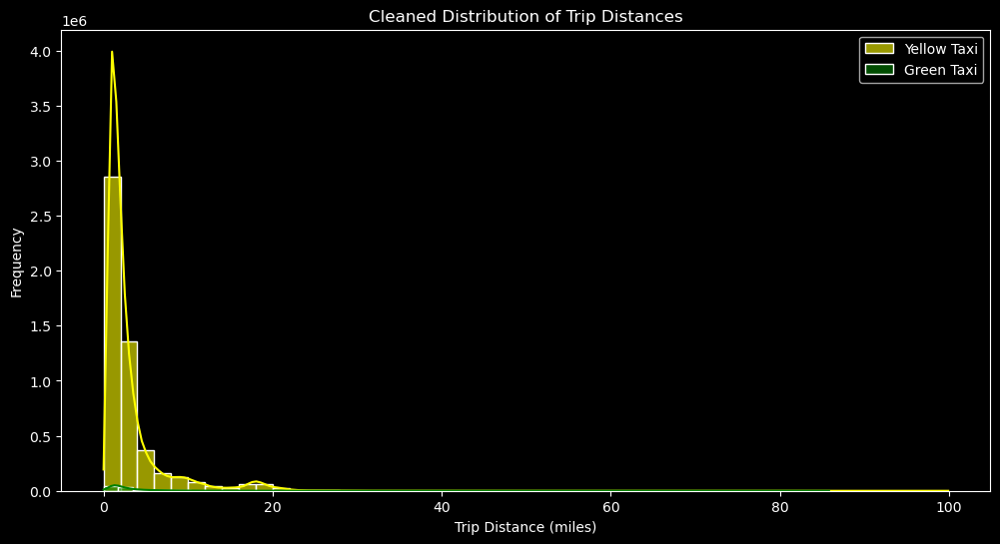

In [24]:
# After cleaning the data, we can replot the histograms and scatter plot to confirm improvements: 
    # Re-Plot histogram 
plt.figure(figsize=(12, 6))
sns.histplot(df_yellow['trip_distance'], bins=50, kde=True, color='yellow', label='Yellow Taxi', alpha=0.6)
sns.histplot(df_green['trip_distance'], bins=50, kde=True, color='green', label='Green Taxi', alpha=0.6)
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Frequency')
plt.title('Cleaned Distribution of Trip Distances')
plt.legend()
plt.show()

In the initial histogram, the x-axis represented trip distances in miles, while the y-axis showed frequency (number of trips). However, the presence of extreme outliers—some exceeding 300,000 miles—distorted the distribution, making it difficult to interpret realistic trip patterns. These extreme values compressed the majority of trips into a small range near zero, preventing meaningful analysis.

After cleaning the data by removing unrealistic trip distances (over 100 miles), negative or zero fares, and trips with zero passengers, the new histogram presents a much clearer distribution. Now, the x-axis still represents trip distances, but the range is limited to 0-100 miles, which reflects real-world taxi behavior. The y-axis continues to represent frequency, but with a much more interpretable scale, showing that most taxi rides fall between 1-10 miles, with fewer long-distance trips.

This comparison demonstrates that data cleaning was essential for accurate analysis, removing anomalies that previously misrepresented the dataset. The cleaned histogram now properly visualizes the true distribution of taxi trips, allowing for better insights and more reliable conclusions.

The lower frequency of **green taxi** trips compared to **yellow taxis** could be due to service area restrictions, lower demand, and a smaller fleet size. Green taxis mainly operate in outer boroughs and cannot pick up passengers in central Manhattan, where yellow taxis dominate. Yellow taxis also serve high-demand locations like airports and train stations, leading to a higher trip count. This difference in trip volume aligns with the operational roles of each taxi type in New York City.

**Pickup location ID**

To confirm whether green taxis primarily operate in the outer boroughs, the pickup location ID must be analyzed, and the frequency of trips across different zones compared.

Columns in df_zones: Index(['LocationID', 'Borough', 'Zone', 'service_zone'], dtype='object')


<Figure size 1000x600 with 0 Axes>

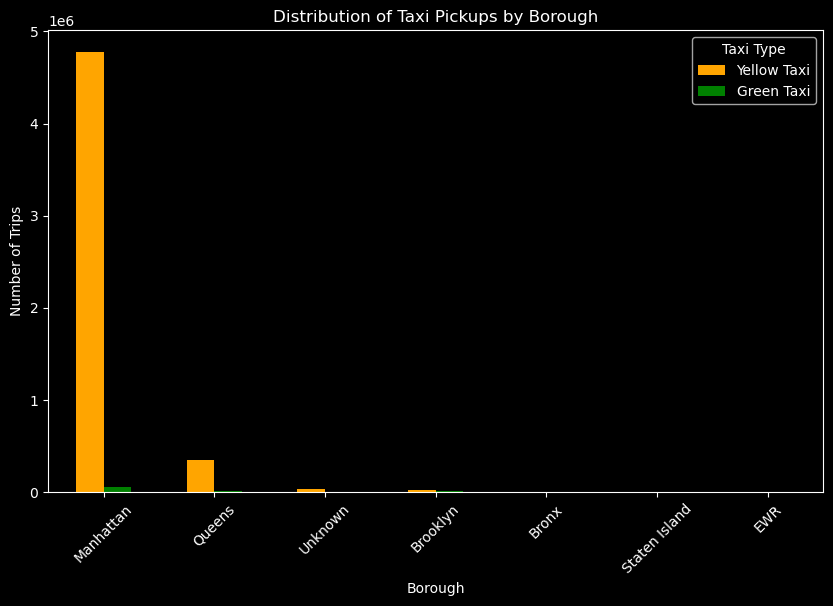

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the taxi zone lookup data
zones_url = "https://d37ci6vzurychx.cloudfront.net/misc/taxi_zone_lookup.csv"
df_zones = pd.read_csv(zones_url)

# Check column names in df_zones
print("Columns in df_zones:", df_zones.columns)

# Merge the trip data with taxi zones
df_yellow = df_yellow.merge(df_zones, left_on="PULocationID", right_on="LocationID", how="left", suffixes=("_trip", "_zone"))
df_green = df_green.merge(df_zones, left_on="PULocationID", right_on="LocationID", how="left", suffixes=("_trip", "_zone"))

# Use the correct Borough column name
yellow_borough_counts = df_yellow["Borough"].value_counts()
green_borough_counts = df_green["Borough"].value_counts()

# Convert to DataFrame for visualization
df_borough = pd.DataFrame({
    "Borough": yellow_borough_counts.index,
    "Yellow Taxi": yellow_borough_counts.values,
    "Green Taxi": green_borough_counts.reindex(yellow_borough_counts.index, fill_value=0).values
})

# Plot Borough distribution with custom colors
plt.figure(figsize=(10, 6))
df_borough.set_index("Borough").plot(kind="bar", figsize=(10, 6), color=["orange", "green"])

plt.xlabel("Borough")
plt.ylabel("Number of Trips")
plt.title("Distribution of Taxi Pickups by Borough")
plt.xticks(rotation=45)
plt.legend(title="Taxi Type")
plt.show()


The bar chart confirms that yellow taxis predominantly operate in Manhattan, with an overwhelming number of pickups compared to other boroughs. Green taxis, on the other hand, have significantly fewer pickups, mainly in Queens and some presence in Brooklyn. This aligns with regulations that restrict yellow taxis to high-demand areas like Manhattan while allowing green taxis to serve outer boroughs. The data supports the claim that green taxis primarily operate outside Manhattan, explaining their lower trip volume overall.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


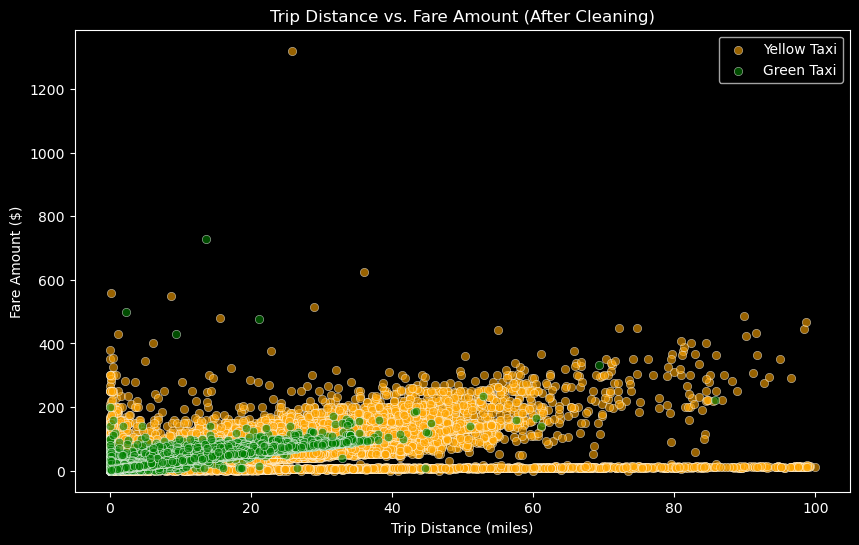

In [26]:
    # Re-Plotting the scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['fare_amount'], alpha=0.6, color="orange", label="Yellow Taxi")
sns.scatterplot(x=df_green['trip_distance'], y=df_green['fare_amount'], alpha=0.6, color="green", label="Green Taxi")
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Fare Amount ($)')
plt.title('Trip Distance vs. Fare Amount (After Cleaning)')
plt.legend()
plt.show()

The cleaned scatter plot looks significantly improved compared to the previous version, as extreme outliers in trip distances (300,000+ miles) have been removed. However, there are still some inconsistencies, such as trips over 100 miles where the fare remains near zero. 

In [27]:
# Display trips where trip_distance > 50 but fare_amount is very low (< $10)
long_distance_low_fare = df_yellow[(df_yellow['trip_distance'] > 50) & (df_yellow['fare_amount'] < 10)]
print(long_distance_low_fare)


         VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
4879            1  2021-06-01 07:20:15   2021-06-01 07:32:04              1.0   
8221            1  2021-06-01 08:08:48   2021-06-01 08:19:52              1.0   
8301            1  2021-06-01 08:22:31   2021-06-01 08:30:15              2.0   
30017           1  2021-06-01 13:49:54   2021-06-01 14:01:11              1.0   
35370           1  2021-06-01 14:03:13   2021-06-01 14:14:54              1.0   
...           ...                  ...                   ...              ...   
4926406         1  2021-07-29 07:10:55   2021-07-29 07:18:47              1.0   
4965773         1  2021-07-29 15:59:34   2021-07-29 16:09:49              2.0   
5021396         1  2021-07-30 08:03:16   2021-07-30 08:09:46              1.0   
5024840         1  2021-07-30 09:09:44   2021-07-30 09:18:45              1.0   
5065185         1  2021-07-30 17:47:59   2021-07-30 18:00:04              1.0   

         trip_distance  Rat

**Payment type**

In [28]:
# Check if specific payment types (e.g., promotions, unknown payments) are causing low fares
print(long_distance_low_fare['payment_type'].value_counts())


payment_type
1    182
2     40
Name: count, dtype: int64


In [29]:
# Check if specific payment types (e.g., promotions, unknown payments) are causing low fares
print(long_distance_low_fare['payment_type'].value_counts())

payment_type
1    182
2     40
Name: count, dtype: int64


The analysis of long-distance trips (over 50 miles) with fares under $10 revealed 222 such records, which is highly unusual. Looking at the payment types, the majority (182) were categorized as payment type 1, which typically represents cash or credit card payments, while 40 were type 2, often associated with corporate account payments.

This suggests that the low fares are not due to promotional rides or unknown payment types but could instead result from data entry errors, missing fare components, or misclassified trips. The pickup locations in Manhattan further indicate that these should not be legitimate long-haul rides at such low prices.

To identify additional factors influencing low-fare long-distance trips, the analysis will now be extended.

**Identifying Suspicious Low-Fare Long-Distance Trips**

In [30]:
# Display trips where fare amount is very low despite long trip distance
suspect_trips = df_yellow[
    (df_yellow['trip_distance'] > 50) & 
    (df_yellow['fare_amount'] < 10)
]
print(suspect_trips[['trip_distance', 'fare_amount', 'payment_type', 'total_amount', 'extra', 'mta_tax', 'tolls_amount']].head(50))

        trip_distance  fare_amount  payment_type  total_amount  extra  \
4879             64.8         9.50             1         15.35    2.5   
8221             63.5         9.50             1         14.72    2.5   
8301             50.2         7.50             1         12.96    2.5   
30017            56.5         9.50             1         16.60    2.5   
35370            55.5         9.00             1         15.35    2.5   
46742            58.4         9.50             1         15.80    3.5   
58307            66.6         9.00             1         15.95    3.5   
72010            53.9         7.00             1         11.88    3.0   
87213            56.9         8.00             2         11.30    2.5   
91244            62.7         8.50             2         11.80    2.5   
100479           55.5         8.00             1         13.55    2.5   
155843           78.6         9.50             1         15.95    3.0   
159613           63.1         8.50             1   

The analysis of long-distance taxi trips exceeding 50 miles with unexpectedly low fares (under $10) reveals significant inconsistencies in the data. While fare amounts remain unusually low, the total amount is often higher due to additional surcharges, yet key fare components such as tolls frequently appear as zero. This suggests that some charges may be missing or misrecorded.

Moreover, the base fares themselves appear unrealistically low. For instance, a 64.8-mile trip costing only $9.50 is far below expected NYC taxi pricing, where fares should increase proportionally with distance. The payment types, however, show no indication of discounts, as most trips are processed through standard credit card or cash payments. This eliminates the possibility that these low fares are the result of promotional rides or special payment methods.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


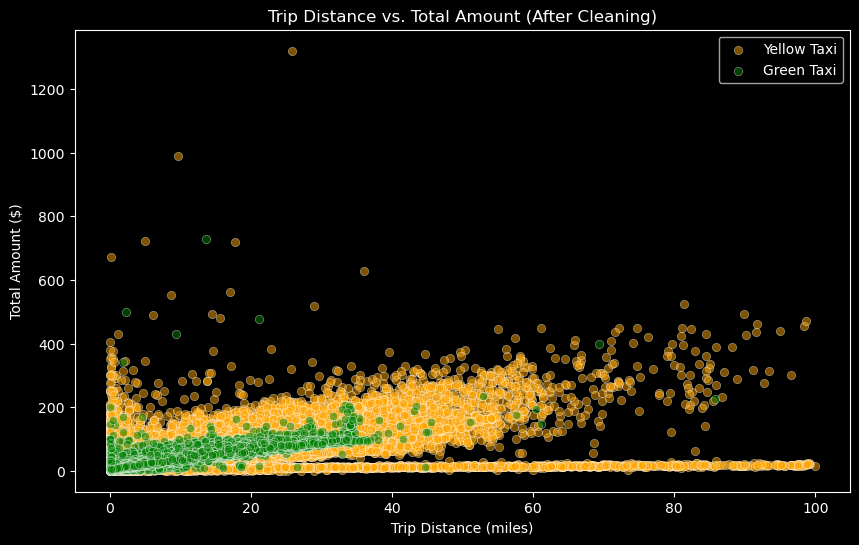

In [31]:
# Re-Plotting the scatter plot using total_amount instead of fare_amount
plt.figure(figsize=(10, 6))

sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['total_amount'], 
                alpha=0.5, color="orange", label="Yellow Taxi")

sns.scatterplot(x=df_green['trip_distance'], y=df_green['total_amount'], 
                alpha=0.5, color="green", label="Green Taxi")

plt.xlabel("Trip Distance (miles)")
plt.ylabel("Total Amount ($)")  # Updated y-axis to reflect total_amount
plt.title("Trip Distance vs. Total Amount (After Cleaning)")
plt.legend()
plt.show()

After cleaning the dataset by removing extreme outliers, the scatter plot now presents a more realistic distribution of total trip amounts relative to trip distance. The expected trend is observed—total fare generally increases with trip distance, particularly for yellow taxis, which serve a broader range of longer trips compared to green taxis.
However, despite data cleaning, some inconsistencies remain. A few long-distance trips (above 50 miles) still have low total amounts, suggesting possible missing fare components, unaccounted tolls, or potential misclassification of fares. Additionally, while the majority of fares align with expected pricing trends, certain points show unexpectedly high total amounts, which may indicate additional surcharges or peak-hour pricing effects.

Overall, the cleaned scatter plot better represents the logical fare-distance relationship.

**Comparison of fare amount VS total amount across trip distance**

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


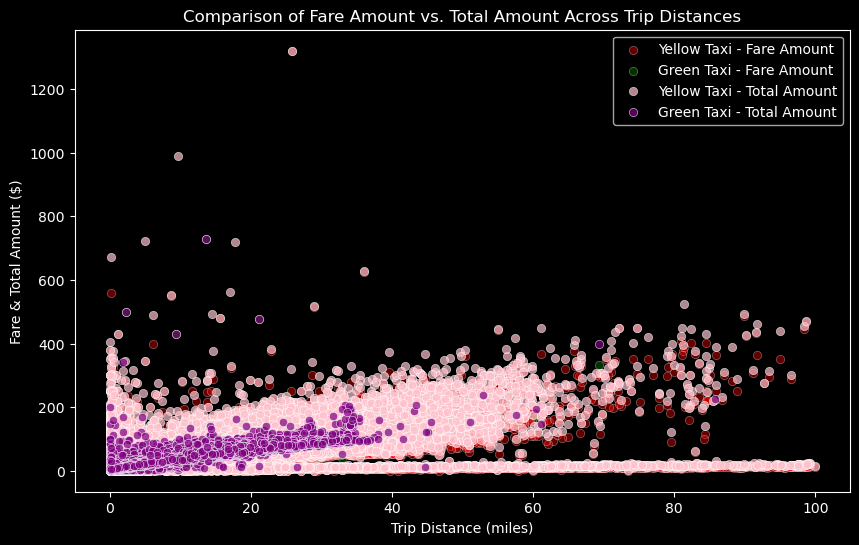

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define plot size
plt.figure(figsize=(10, 6))

# Plot scatter for Fare Amount
sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['fare_amount'], alpha=0.4, color="red", label="Yellow Taxi - Fare Amount")
sns.scatterplot(x=df_green['trip_distance'], y=df_green['fare_amount'], alpha=0.4, color="green", label="Green Taxi - Fare Amount")

# Plot scatter for Total Amount (on top of Fare Amount)
sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['total_amount'], alpha=0.7, color="pink", label="Yellow Taxi - Total Amount")
sns.scatterplot(x=df_green['trip_distance'], y=df_green['total_amount'], alpha=0.7, color="purple", label="Green Taxi - Total Amount")

# Labels and Title
plt.xlabel("Trip Distance (miles)")
plt.ylabel("Fare & Total Amount ($)")
plt.title("Comparison of Fare Amount vs. Total Amount Across Trip Distances")

# Display legend
plt.legend()
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


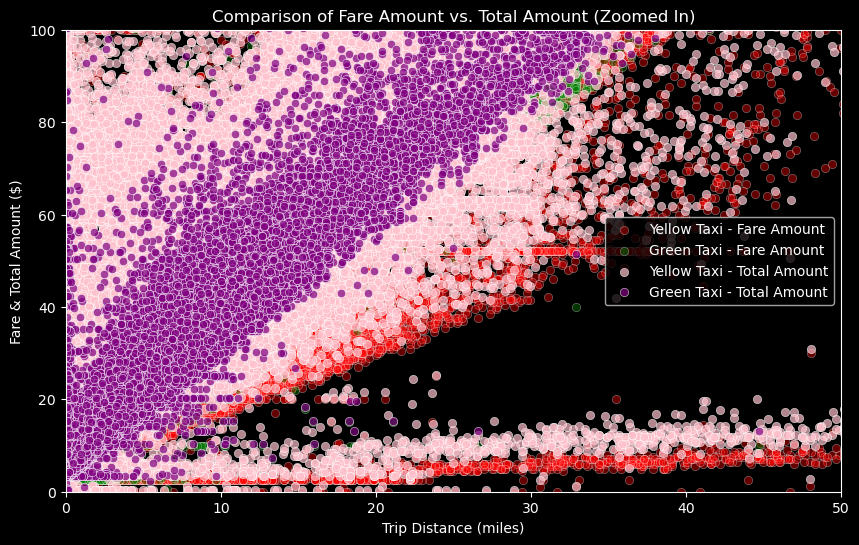

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define plot size
plt.figure(figsize=(10, 6))

# Plot scatter for Fare Amount
sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['fare_amount'], alpha=0.4, color="red", label="Yellow Taxi - Fare Amount")
sns.scatterplot(x=df_green['trip_distance'], y=df_green['fare_amount'], alpha=0.4, color="green", label="Green Taxi - Fare Amount")

# Plot scatter for Total Amount (on top of Fare Amount)
sns.scatterplot(x=df_yellow['trip_distance'], y=df_yellow['total_amount'], alpha=0.7, color="pink", label="Yellow Taxi - Total Amount")
sns.scatterplot(x=df_green['trip_distance'], y=df_green['total_amount'], alpha=0.7, color="purple", label="Green Taxi - Total Amount")

# Labels and Title
plt.xlabel("Trip Distance (miles)")
plt.ylabel("Fare & Total Amount ($)")
plt.title("Comparison of Fare Amount vs. Total Amount (Zoomed In)")

# Set y-axis limit to focus on reasonable fares
plt.ylim(0, 100)  # Zoom in on fares under $100
plt.xlim(0, 50)  # Limit trip distance to 50 miles

# Display legend
plt.legend()
plt.show()

The zoomed-in scatter plot provides a much clearer view of the relationship between trip distance, fare amount, and total amount for both yellow and green taxis. By limiting the x-axis to 50 miles and the y-axis to $100, I can now see how fare structures differ without being distorted by extreme outliers.
From this plot, it can be observed that the gap between fare amount and total amount is larger for yellow taxis, which suggests that extra charges such as tolls and surcharges contribute more to their final cost compared to green taxis. The fare amounts (red and green points) follow a relatively linear pattern, indicating that base fares are charged consistently per mile. 

However, the total amounts (pink and purple points) show greater spread, meaning that additional charges vary significantly, likely due to location-based fees or peak pricing.

Short trips (under 10 miles) show the most variability in total cost, with some trips having low base fares but much higher final costs, suggesting the presence of minimum fare rules or fixed fees that disproportionately affect short rides. 

Additionally, green taxis exhibit less variation in extra charges, as their total amounts remain much closer to their fare amounts compared to yellow taxis. This aligns with the fact that green taxis operate primarily in outer boroughs, where tolls and surcharges are less frequent.

#### Summary
Through this exploratory data analysis, it was able to identify key patterns in trip distances, fares, and passenger counts for yellow and green taxis. Initially, the raw data contained extreme outliers, with some trips exceeding 300,000 miles, which were clearly unrealistic. After applying the interquartile range (IQR) method to filter these outliers, Most trips are relatively short, with the majority under 10 miles. Yellow taxis tend to have slightly longer trips on average than green taxis, which aligns with their primary operation in Manhattan.

When analyzing fare amounts, a clear difference between fare amount and total amount was observed, especially for yellow taxis. Yellow taxi trips tend to have significantly higher total amounts due to surcharges, tolls, and peak-hour charges, while green taxis show less variation, indicating fewer additional costs. Short trips often have higher relative costs due to base fares and minimum charges, whereas longer trips show a more proportional relationship between distance and cost.

The scatter plots confirmed a strong linear relationship between trip distance and fare amount, indicating that fares are generally calculated consistently per mile. However, total amounts showed greater variation, particularly for yellow taxis, due to additional charges. Most trips had one or two passengers, but some records contained trips with zero passengers, which could indicate data entry issues.

This analysis confirms that yellow taxis generally have higher additional costs than green taxis, and green taxis tend to have shorter trips with fewer surcharges. Cleaning the data by removing extreme outliers made these trends much more interpretable. 

#### Textbook Practice

Applying the Principle of: Choosing an Effective Visual

Chapter 2 of Storytelling with Data emphasizes selecting visuals that highlight key messages, ensure clarity, and facilitate comparisons. This principle was applied in analyzing NYC taxi trip data by refining various visualizations. Initially, histograms revealed extreme outliers in trip distances, distorting the distribution. 

After cleaning the data, the adjusted histogram provided a clearer view of actual trip patterns. 

**Boxplots** further identified outliers, justifying the need for data cleaning, and allowed meaningful comparisons between yellow and green taxis. 

**Scatter plots** were used to examine the relationship between trip distance and fare amount. Before cleaning, they showed unrealistic patterns, such as long trips with near-zero fares, but after removing outliers, the expected trend of fare increasing with distance became clear. 

**Bar charts** effectively illustrated borough-wise taxi operations, showing that yellow taxis dominate Manhattan while green taxis primarily serve outer boroughs. 

By applying these principles, the visualizations became more accurate, ensuring clear and effective storytelling with data.

### Task 3: Spatial Analysis
This task focuses on analyzing the geographic distribution of taxi trips to identify demand hotspots. Using tools like Kepler.gl, pickup and drop-off locations, as well as trip routes, can be visualized. Understanding these spatial patterns helps in detecting high-traffic areas and potential inefficiencies in taxi operations.

**Install Necessary Libraries:**

In this step, the gdown library is being installed. This library allows data to be downloaded directly from Google Drive using a shareable URL. Since the dataset needed for the spatial analysis task is hosted on Google Drive, this step ensures easy retrieval of data to continue with the analysis. The code is as follows:

In [34]:
pip install gdown

Note: you may need to restart the kernel to use updated packages.


**Inspect the Loaded Data:**

After installing gdown, it is used to download the zone data from Google Drive. The next step is to inspect the first few rows of the dataset using df.zones.head(), which helps verify that the data has been loaded correctly and that the columns and data appear as expected. 

Checking the first rows also helps identify any obvious issues (e.g., formatting problems or missing values) before proceeding with further analysis. This step is essential for ensuring data quality.

In [35]:
# Install gdown if not already installed
%pip install gdown

import gdown

# Define the Google Drive file ID and the output file name
file_id = '12VgjWXkyEBsxzuKFxIkAevEbao85ei0T'
output = 'taxi_zone_lookup.csv'

# Download the file from Google Drive
gdown.download(f'https://drive.google.com/uc?id={file_id}', output, quiet=False)

# Load the downloaded CSV file into a DataFrame
df_zones = pd.read_csv(output)

# Inspect the first few rows of the dataframe to ensure it loaded correctly
print(df_zones.head())

Note: you may need to restart the kernel to use updated packages.


Downloading...
From: https://drive.google.com/uc?id=12VgjWXkyEBsxzuKFxIkAevEbao85ei0T
To: /Users/amalielundorff/Desktop/Group 8 /taxi_zone_lookup.csv
100%|██████████| 26.5k/26.5k [00:00<00:00, 1.94MB/s]

   Shape_Leng  Shape_Area                     zone  LocationID        borough  \
0    0.116357    0.000782           Newark Airport           1            EWR   
1    0.433470    0.004866              Jamaica Bay           2         Queens   
2    0.084341    0.000314  Allerton/Pelham Gardens           3          Bronx   
3    0.043567    0.000112            Alphabet City           4      Manhattan   
4    0.092146    0.000498            Arden Heights           5  Staten Island   

         lat        lng  
0  40.689516 -74.176786  
1  40.625724 -73.826126  
2  40.865888 -73.849479  
3  40.724152 -73.977023  
4  40.550340 -74.189930  


The first few rows of the dataframe have been printed to ensure that the data is loaded correctly. 

The output confirms that it contains information about different taxi zones in New York City, including geographical details such as zone names, location IDs, boroughs, and latitude and longitude coordinates. 

The **Shape_Leng** and **Shape_Area** columns likely represent the perimeter and area of each zone, respectively. This data is crucial for spatial analysis, as it provides the foundation for mapping, calculating distances, and understanding the distribution of taxi demand across different zones and boroughs.

**Removeing duplicates:**

Ensuring that there are no duplicates in the analysis is crucial, duplicate entries are removed based on the 'LocationID' column. The drop_duplicates function is used to keep only the first occurrence of each LocationID and remove any subsequent duplicates. 

This is essential for ensuring that each location is represented only once in the dataset, which is important for accurate spatial analysis and prevents distortion of results.

In [36]:
# Removing duplicates by keeping the first occurrence
df_zones = df_zones.drop_duplicates(subset='LocationID', keep='first')

**Defining time period and selecting relevant columns:**

The start and end times for the analysis are defined, focusing on data from June 15, 2021, between 10:00 AM and 12:00 PM. 

This time period is chosen to narrow down the dataset to a specific timeframe, making it easier to identify patterns and trends during that period.

In [37]:
# Define start and end times for the period in 2021, June and July
start_time = '2021-06-15 10:00:00'
end_time = '2021-06-15 12:00:00'





# Next, define which columns to keep for the analysis. In this case, selecting
# Select specific columns
selected_columns = [
    'tpep_pickup_datetime', # Pickup date and time
    'tpep_dropoff_datetime', # Dropoff date and time
    'PULocationID', # Pickup location ID
    'DOLocationID', # Dropoff location ID
    'fare_amount', # Fare amount
]
# These columns are selected because they contain the key data needed for spatial analysis, 
# Such as the time of the trip, pickup/dropoff locations, and the fare amount for analysis.

**Filtering the data for the defined time period:**

n this step, the yellow taxi data is filtered to include only rides that occurred within the defined time period. Specifically, records are selected where **'tpep_pickup_datetime'** falls between the **'start_time'** **(2021-06-15 10:00:00)** and **'end_time'** **(2021-06-15 12:00:00)**. This filtering step helps focus on a specific timeframe, making the analysis more manageable and allowing for better observation of patterns in taxi activity during this period.

Additionally, only the relevant columns defined in the 'selected_columns' list are selected, ensuring that the analysis is conducted using only the necessary data.

In [38]:
# Filter the yellow taxi data for the defined time period
df_yellow_selected = df_yellow[
    (df_yellow['tpep_pickup_datetime'] >= start_time) &
    (df_yellow['tpep_pickup_datetime'] <= end_time)
][selected_columns]

**Adding latitude and longitude for pickup locations:**

In the next step, latitude and longitude information is added to the taxi data based on the pickup location **(PULocationID)**. The **'df_zones'** dataframe is joined to incorporate the geographical details., which contains the latitude and longitude data for each zone, with the filtered yellow taxi data **('df_yellow_selected')** using the **'PULocationID'** as the key. 

This join operation adds the **'pickup_lat'** and **'pickup_lng'** columns to our dataset to represent the coordinates of the pickup locations.

In [39]:
# Add latitude and longitude for pickup locations
pickup_locations = df_yellow_selected.join(
    df_zones.set_index('LocationID'), on="PULocationID", how='left'
)

# Rename the columns to make them more meaningful and easier to work with.
# The 'lat' column is renamed to 'pickup_lat', and 'lng' is renamed to 'pickup_lng'
pickup_locations = pickup_locations.rename(
    {'lat': 'pickup_lat', 'lng': 'pickup_lng'}, axis=1
)[['pickup_lat', 'pickup_lng']]

**Adding latitude and longitude for dropoff locations:**

This step is similar to the previous one, but now latitude and longitude data are added for the dropoff locations. The **df_zones** dataframe, which contains geographical information, is joined with the filtered yellow taxi data using **DOLocationID** as the key. This process adds the **dropoff_lat** and **dropoff_lng** columns to the dataset, representing the coordinates of the dropoff locations.

In [40]:
# Add latitude and longitude for dropoff locations
dropoff_locations = df_yellow_selected.join(
    df_zones.set_index('LocationID'), on="DOLocationID", how='left'
)
# Rename the columns to 'dropoff_lat' and 'dropoff_lng' for clarity.
# Making it clear that these columns represent the coordinates of the dropoff locations.
dropoff_locations = dropoff_locations.rename(
    {'lat': 'dropoff_lat', 'lng': 'dropoff_lng'}, axis=1
)[['dropoff_lat', 'dropoff_lng']]

**Merging latitude and longitude data back into the main DataFrame:**

Here, the latitude and longitude data for both pickup and dropoff locations are merged into the **df_yellow_selected** DataFrame. By iterating over the columns of the **pickup_locations** and **dropoff_locations** DataFrames, the geographic data is integrated for analysis. 

Additionally, the **tpep_pickup_datetime** and **tpep_dropoff_datetime** columns are converted into strings for consistency and ease of export. 

Finally, the enriched dataset is saved to a CSV file **('yellow_taxi.csv')**, making it ready for further analysis or visualization.

In [41]:
# Merge the latitude and longitude data back into the main DataFrame
for col in pickup_locations.columns:
    df_yellow_selected[col] = pickup_locations[col]

for col in dropoff_locations.columns:
    df_yellow_selected[col] = dropoff_locations[col]


df_yellow_selected['tpep_pickup_datetime'] = df_yellow_selected['tpep_pickup_datetime'].astype(str)
df_yellow_selected['tpep_dropoff_datetime'] = df_yellow_selected['tpep_dropoff_datetime'].astype(str)


df_yellow_selected.to_csv('yellow_taxi.csv', index=False)

##### **Analysis of taxi rides in New York (june 15, 2021, between 10:00 AM and 12:00 PM)**

The purpose of the visualization is to provide an in-depth spatial analysis of the taxi demand in New York City for a specific time period – on June 15, 2021 between 10:00 AM and 12:00 PM. This visualization helps understand patterns in taxi activity, identify hotspots of high activity (eg, busy areas like Times Square and transportation hubs like JFK Airport), and provide insight into which areas of the city are in higher demand than others.

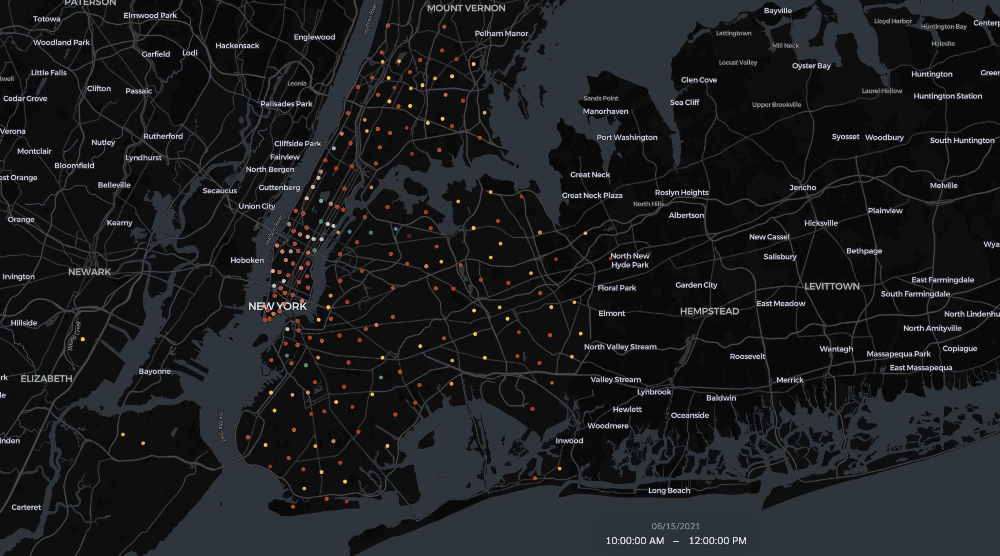

In [42]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image as PILImage
from IPython.display import Image, display

# Path to your PNG file
image_path = "Kepler.png"  # Update this path if needed

# Verify if the file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"🚨 ERROR: Image not found at {image_path}. Check the file path!")

# Display image using PIL (Python script)
img = PILImage.open(image_path)
img.show()



# Display image inline (Jupyter Notebook)
display(Image(filename=image_path))


#### Textbook Practice

**How the Visualization Was Created:**

**Key Observations:**   

**Taxi Demand Across Different Areas:**
* High taxi demand during this period was concentrated in central Manhattan, particularly around popular commercial and transport hubs like Times Square, Grand Central Station, and JFK Airport. These areas were highlighted by clusters of orange and red dots, indicating increased taxi activity linked to higher fare amounts.
* Lower-demand zones, represented by blue and green dots, were predominantly located in residential and suburban areas, showing fewer taxi rides.

**Color Coding and Its Significance:**
* The Quantile color scale was applied to show relative activity levels across the city. Red and orange zones represented areas with high taxi demand, where fares were generally higher, often due to longer trips or traffic congestion. Blue and green zones indicated areas with lower fare amounts and less frequent taxi use.
* The fare data offers further insight into the dynamics of taxi demand: higher fares are often associated with popular locations near tourist attractions or transportation hubs.

**Time-Based Trends and Patterns:**
* Using Kepler.gl’s timeline feature, we observed how taxi demand fluctuated over the course of the two-hour period.
* The morning rush was evident, with increased taxi activity around major transportation centers such as Times Square and JFK Airport as people headed to work or traveled.
* As the timeline moved toward noon, the taxi activity stabilized, with consistent demand continuing in key commercial districts and tourist hotspots.

**Identification of Hotspots:**
JFK Airport: This location stood out as a major hotspot, with a high concentration of red and orange dots, reflecting peak taxi demand due to the large volume of passengers.
* Times Square and Grand Central Station: These locations also saw high activity, indicative of the steady flow of commuters and tourists.
* Emerging Hotspots in Brooklyn: Areas like Downtown Brooklyn also displayed increasing taxi activity, potentially linked to local events or changing travel patterns.

**Implications of the Data:**
* Commercial Districts: Areas like Midtown Manhattan are crucial for taxi services during office hours due to the high volume of commuters. Enhanced fleet availability in these areas would improve service efficiency during peak demand times.
* Residential and Suburban Areas: The lower taxi activity in suburban areas presents an opportunity for improved service delivery, potentially through optimized scheduling and strategic placement of taxis during peak commuting hours.

**Strategic Recommendations:**
* Optimizing Fleet Allocation: Taxi services should prioritize the allocation of fleets in high-traffic zones like Times Square, Grand Central Station, and JFK Airport. This will ensure enough vehicles are available during periods of peak demand.
* Targeting New Emerging Hotspots: As areas like Downtown Brooklyn show increased taxi demand, taxi operators should consider adjusting their fleet distribution to accommodate the growing activity in these zones.
* Data-Driven Planning for Future Service: By leveraging insights from Kepler.gl, taxi companies can optimize their routes and adjust schedules based on changing demand patterns, ensuring better service in both high-traffic and less frequented areas.


#### Summary

This analysis, based on Kepler.gl’s powerful mapping capabilities, sheds light on the complex factors that influence taxi demand in New York City, such as proximity to commercial districts, transportation hubs, and time-based patterns. By understanding these factors, taxi services can improve operational efficiency, better match supply with demand, and make informed decisions for future urban mobility solutions. The use of real-time data makes it possible to quickly adapt to changing demand and ensure better service coverage across the city.

### Task 4: Temporal Analysis

In this task, the temporal patterns of taxi rides will be analyzed, focusing on the correlation between overall taxi rides and temporal values rather than the type of taxi. The analysis includes examining the number of rides by time of day and day of the week, as well as the relationship between temporal patterns and other variables such as trip distance and fare. Only data from June and July (06, 07) in the year 2021 will be analyzed to reduce the dataset size due to technical limitations in loading all data material.

In [43]:
# Starting by importing libraries:
# Import 'pandas' because of its effective functions used for data manipulation and analyzing data. 
# Import 'numpy' because it will be used for numerical operations. 
# Import 'matplotlib.pyplot and seaborn for illustrating our data. 
# Data from previously are loaded as well 

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from src.utils import load_data_from_google_drive

In [ ]:

import pandas as pd

# Libraries have been loaded, so the next step is loading the data for both the yellow and green taxi.  
# Load it into a defined DataFrame, one for the yellow taxi and one for the green taxi.  
# Using the cleaned data from Task 2.  
# Load the datasets.  
# The DataFrames will be called: green taxi and yellow taxi, with "ta" added for temporal analysis.  


green_taxi_ta = pd.read_csv("cleaned_green_taxi_data.csv")
yellow_taxi_ta = pd.read_csv("cleaned_yellow_taxi_data.csv")

In [45]:
# Print the columns to see the names of the datetime columns, since they will be converted.
print(green_taxi_ta.columns)
print(yellow_taxi_ta.columns)


Index(['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime',
       'store_and_fwd_flag', 'RatecodeID', 'PULocationID', 'DOLocationID',
       'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'ehail_fee', 'improvement_surcharge',
       'total_amount', 'payment_type', 'trip_type', 'congestion_surcharge',
       'LocationID_x', 'Borough_x', 'Zone_x', 'service_zone_x', 'LocationID_y',
       'Borough_y', 'Zone_y', 'service_zone_y', 'LocationID_trip',
       'Borough_trip', 'Zone_trip', 'service_zone_trip', 'LocationID_zone',
       'Borough_zone', 'Zone_zone', 'service_zone_zone', 'LocationID',
       'Borough', 'Zone', 'service_zone'],
      dtype='object')
Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag',
       'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amou

Below codes convert the pickup datetime for each taxi into a datetime format to extract specific days and hours. The extraction will make it easier to analyze specific groups of data, such as an exact day or hour.

In [46]:
import pandas as pd

# Load the datasets

green_taxi_ta = pd.read_csv("cleaned_green_taxi_data.csv")
yellow_taxi_ta = pd.read_csv("cleaned_yellow_taxi_data.csv")

 
# The column being converted for the green taxi data is 'lpep_pickup_datetime'.  
# The column being converted for the yellow taxi data is 'tpep_pickup_datetime'.  

green_taxi_ta['lpep_pickup_datetime'] = pd.to_datetime(green_taxi_ta['lpep_pickup_datetime'])
yellow_taxi_ta['tpep_pickup_datetime'] = pd.to_datetime(yellow_taxi_ta['tpep_pickup_datetime'])

With the datetime converted, the next step is to define the temporal values in the data. This ensures that the necessary data is available for temporal analysis. Temporal values will be defined for the columns: Hour, Day of the Week, and Month.

In [47]:
import pandas as pd

# Temporal values for the green taxi.
green_taxi_ta['hour'] = green_taxi_ta['lpep_pickup_datetime'].dt.hour
green_taxi_ta['day_of_week'] = green_taxi_ta['lpep_pickup_datetime'].dt.day_name()
green_taxi_ta['month'] = green_taxi_ta['lpep_pickup_datetime'].dt.month_name()

# Temporal values for the yellow taxi.
yellow_taxi_ta['hour'] = yellow_taxi_ta['tpep_pickup_datetime'].dt.hour
yellow_taxi_ta['day_of_week'] = yellow_taxi_ta['tpep_pickup_datetime'].dt.day_name()
yellow_taxi_ta['month'] = yellow_taxi_ta['tpep_pickup_datetime'].dt.month_name()

# The dataset with our temporal values will be printed, to make sure that the new temporal columns are added. 
print(green_taxi_ta[['lpep_pickup_datetime', 'hour', 'day_of_week', 'month']].head())
print(yellow_taxi_ta[['tpep_pickup_datetime', 'hour', 'day_of_week', 'month']].head())


  lpep_pickup_datetime  hour day_of_week month
0  2021-06-01 00:31:19     0     Tuesday  June
1  2021-06-01 00:16:07     0     Tuesday  June
2  2021-06-01 00:03:58     0     Tuesday  June
3  2021-06-01 00:00:57     0     Tuesday  June
4  2021-06-01 00:33:22     0     Tuesday  June
  tpep_pickup_datetime  hour day_of_week month
0  2021-06-01 00:13:26     0     Tuesday  June
1  2021-06-01 00:32:23     0     Tuesday  June
2  2021-06-01 00:31:01     0     Tuesday  June
3  2021-06-01 00:20:05     0     Tuesday  June
4  2021-06-01 18:08:35    18     Tuesday  June


From the print output, it is now possible to observe the pickup datetime, hour, day of the week, and month. This confirms that the columns have been successfully added.

In [48]:
import pandas as pd

# Before combining the two dataframes to 1 dataframe, the columns will be renamed so the dataframes merge correctly. 
# Rename the column: 'lpep_pickup_datetime' = 'pickup_datetime'
# Rename the column: 'tpep_pickup_datetime' = 'pickup_datetime'

green_taxi_ta.rename(columns={'lpep_pickup_datetime': 'pickup_datetime'}, inplace=True)
yellow_taxi_ta.rename(columns={'tpep_pickup_datetime': 'pickup_datetime'}, inplace=True)

# With the temporal values extracted, the next step is to combine the two dataframes into a single dataframe.  
# To merge the yellow and green taxi data, the Pandas function `concat()` is used.  
# Additionally, the `ignore_index` parameter is included to reset the index, ensuring a streamlined dataset for analysis.  

combined_taxi_ta = pd.concat([green_taxi_ta, yellow_taxi_ta], ignore_index=True)


In [49]:
import pandas as pd

# Print the combined dataframe to check the first few rows.  
# Display the temporal variables defined earlier.  

print(combined_taxi_ta[['pickup_datetime', 'hour', 'day_of_week', 'month']].head())

      pickup_datetime  hour day_of_week month
0 2021-06-01 00:31:19     0     Tuesday  June
1 2021-06-01 00:16:07     0     Tuesday  June
2 2021-06-01 00:03:58     0     Tuesday  June
3 2021-06-01 00:00:57     0     Tuesday  June
4 2021-06-01 00:33:22     0     Tuesday  June


With the combined dataframe computed and the temporal data defined, the next step is to analyze the dataset. The analysis begins by examining the number of rides based on the time of day. Since the temporal variables have already been extracted, various plots can be created to identify temporal patterns in taxi rides. Additionally, the relationship between temporal patterns and other factors, such as trip distance and fare, will be explored.

To analyze daily patterns, the hour of pickup (0-23) has been extracted. Weekly patterns are examined by converting the pickup day into weekday names, making it easier to identify trends. Although the month variable was also extracted, technical limitations in handling large datasets restricted the analysis to two months. As a result, the focus will be on daily and weekly patterns, as these provide valuable insights into the correlation between taxi rides and time

**Rides by hour of the day**

To analyze the number of rides by hour of the day, the data is grouped by hour, and the count of rides for each hour is calculated using the groupby() function. The hours range from 0 to 23, covering the entire day. 

hour
0     127632
1      84168
2      55021
3      33469
4      20413
5      27279
6      78512
7     139267
8     200670
9     231811
10    260548
11    287635
12    318700
13    326718
14    350892
15    355126
16    346714
17    366469
18    386492
19    345008
20    277417
21    256784
22    226250
23    180899
dtype: int64


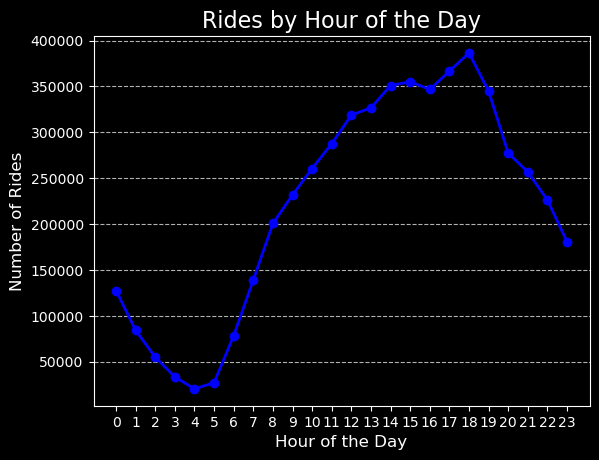

In [50]:
import pandas as pd

# Rides by hour of the day. 


# Print the hourly count to generate a list for identifying the hour with the highest taxi ride count.  
hourly_counts = combined_taxi_ta.groupby('hour').size()
print(hourly_counts)

# Lineplot - Rides by hour of the day. 

# Compute a line plot to illustrate the hourly counts of taxi rides.  
# This provides a visual representation of the values, making it easier to identify correlations.  
# Import the matplotlib library, which is required for plotting.  

import matplotlib.pyplot as plt

# Set the plot size.  
# Specify plot details such as color and marker.  

hourly_counts.plot(
    kind='line',
    color='blue',
    marker='o',
    linestyle='-',
    linewidth=2)

# Compute labels and title for our lineplot. 
# Use range () function to ensure that all 24 hours of the day are shown on the axis.
# Y-axis = Number of rides.
# X-axis = Hour of the day.
# Add horizontal gridlines to improve visual analysis of the illustration.  

plt.title("Rides by Hour of the Day", fontsize=16)
plt.xlabel("Hour of the Day", fontsize=12)  
plt.ylabel("Number of Rides", fontsize=12)
plt.xticks(range(24))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Line plot - number of rides by hour of the day.

The line plot illustrates the number of rides for every hour of the day. Line plots are great for illustrating continuous data trends over time, an example for this is analyzing the hourly changes during the day.
That is why the lineplot is relevant for our analysis, because we are analyzing volume of rides over time (day or hour)
Line plots are good for visualizing patterns and peaks, which is relevant for our analysis. From the plot we can observe that we have our lowest point for number of rides at 04 in the morning, this makes sense since there are not many that are commuting during the very early morning hours. We can then observe increase in the number of rides after 4, where we have peaks during morning (07-09), and during the evening (16-18), this is logical when thinking about when people go to work and when they are typically off. 

**Rides by day of the week**

Codes below is used to analyze the count of rides by day of the week, the data is grouped using the **groupby()** function, which organizes the rides based on the day of the week. This allows for identifying patterns and variations in ride frequency across different days

day_of_week
Monday        91474.571429
Tuesday      114503.714286
Wednesday    120334.285714
Thursday     121234.000000
Friday       117188.142857
Saturday     111048.428571
Sunday        79058.857143
dtype: float64


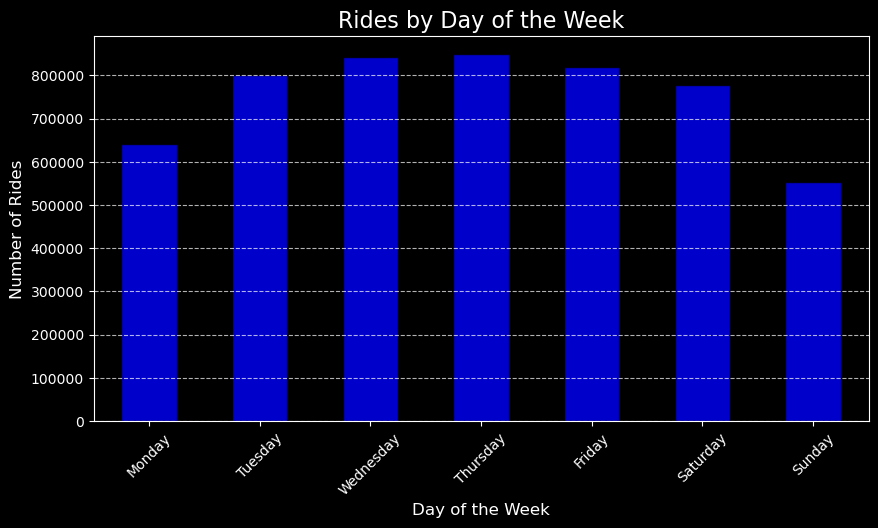

In [51]:
import pandas as pd

# Rides by day of the week.


# Compute the average number of rides for each day of the week.  
# Group by `day_of_week` and calculate the average ride count.  
# Use the `size()` function to count the number of rides for each weekday.  
# Use the `nunique()` function to count unique values in the `day_of_week` column, which equals 7 since there are 7 days in a week.  

average_rides_by_day = combined_taxi_ta.groupby('day_of_week').size() / combined_taxi_ta['day_of_week'].nunique()

# Compute the chronological order of the days.  
# Use the `reindex()` function to reorder the series based on a chronologically ordered list.  
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
average_rides_by_day = average_rides_by_day.reindex(days_order)

# Print the average number of rides for each day of the week.  
# The results show that Thursday has the highest average number of rides.  
# Sunday has the lowest average number of rides.  
# This aligns with expectations, as taxi demand is typically higher on weekdays during commuting hours and lower on weekends when fewer people are commuting.  

print(average_rides_by_day)

# Bar plot - Rides by day
# Compute a bar plot to illustrate the daily counts of taxi rides.  
# This provides a visual representation of the values, making it easier to identify correlations.  
# Import the matplotlib library, required for plotting.  


import matplotlib.pyplot as plt

# For the plot, compute rides by day of the week instead of the previously calculated average.  
# Follow the same steps of grouping the data and correcting the order.  

rides_by_day = combined_taxi_ta.groupby('day_of_week').size()

# # Reorder the days.  
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
rides_by_day = rides_by_day.reindex(days_order)

# Set the plot size.  
# Specify plot details such as color and marker.  
plt.figure(figsize=(10, 5))

# Use the `plot()` function with the kind parameter set to 'bar' to create a bar plot.  
# Specify the type of plot, which in this case is a bar plot, along with details such as color.  
# Generate a bar plot of rides for each day of the week.  
# Apply alpha for transparency.  
# Define the dataset to be used for creating the plot.  

rides_by_day.plot(
    kind='bar',       
    color='blue', 
    alpha=0.8,  
    edgecolor='black')

# Compute labels and title for the barplot. 
# X-axis = Day of the week
# Y-axis = Number of rides
# Add horozontil gridlines, so the illustration is easier to visually analyze. 
plt.title("Rides by Day of the Week", fontsize=16)  
plt.xlabel("Day of the Week", fontsize=12) 
plt.ylabel("Number of Rides", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y',
        linestyle='--',
        alpha=0.7)
plt.show()


Table

The output displays the average number of taxi rides per day of the week. Thursday has the highest average ride count (121,234), while Sunday has the lowest (79,058).

Bar plot - rides by day of the week.

The bar plot visualizes the distribution of rides by day of the week. Bar plots are great for comparing different data over time intervals, such as days or months. From bar plots we can quickly identify which timeperiods contribute more or less, which makes this type of plot great for our analysis, since we are analyzing volume of number of rides by day of the week. In the plot the distribution of rides by day of the week is shown. The plot shows that thursday is the busiest day (121234 rides). We can also observe that sunday is the least busy day for taxi rides (79058.58 rides)

**Rides by hour and day of the week**

Now that plots have been created to analyze the hourly and weekly distribution of rides, the next step is to illustrate both in a single plot.  

A bar plot will be generated to visualize the number of rides by the hour, highlighting which day has the highest ride count for each hour.  


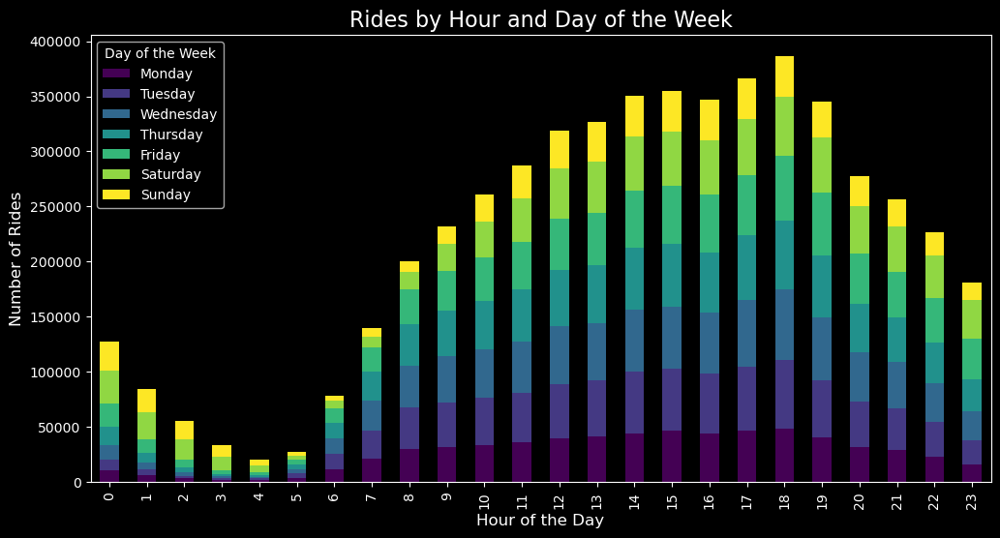

In [52]:
import pandas as pd


# Starting by grouping the data by hour and day of the week to count rides.  
# Use the `groupby()` function to group the dataframe by hour and day of the week.  
# Apply the `size()` function to count the number of occurrences in each group.  
# Use the `unstack()` function to pivot the day of the week index, labeling the columns accordingly.  

rides_by_hour_day = combined_taxi_ta.groupby(['hour', 'day_of_week']).size().unstack()

# Reorder the days according to the previously defined list.  
# Ensure the days follow a chronological sequence.  

rides_by_hour_day = rides_by_hour_day[days_order]

# Stacked bar plot - Rides by hour and day of the week.
# Iimport the matplotlib - library, needed for the plot.

import matplotlib.pyplot as plt

# Compute a stacked bar plot.  
# Specify the type of plot, which in this case is a bar plot.  
# Define plot details such as color, using the 'viridis' colormap for distinct colors.  
# Select the dataset 'rides_by_hour_day' for generating the plot.  

rides_by_hour_day.plot(
    kind='bar', 
    stacked=True, 
    figsize=(12, 6),
    colormap='viridis')

# Compute labels and title for the barplot. 
# Y-axis = Number of rides.
# X-axis = Hour of the day
# The bars are stacked and the different colours visualize different days of the week.
# A colormap is used to indicate which color represents each day.  

plt.title('Rides by Hour and Day of the Week', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=12)
plt.ylabel('Number of Rides', fontsize=12)
plt.legend(title='Day of the Week', fontsize=10)
plt.show()


Stacked bar plot - Rides by hour and day of the week. 

The stacked plot is similar to the lineplot for rides by hour of the day, the only difference is that the stacked plot has colours representing every day of the week. The stacked bar plot is good for this part of our analysis because we are analyzing multiple variables and a group of days. The stacked bar plot is good for analyzing various variables and combining them in one plot. 
We can observe an increase of taxi rides in the morning from 7-9, this is most likely because of more commuting during these hours (people going to work, school etc.). We can observe that monday till friday dominate these hours, which makes sense because of commuting patterns on weekdays, where it is more busy and more people go to work, school etc. Again we can observe an increase during evening rush hour (16-19), where people tend to get off from work, school etc. Again monday to friday dominate these hours. If we look at late night hours, the plot shows that saturday and sunday are more dominant, and more people commute during these hours on the weekend than on weekdays. This can be due to more nightlife and leisure activities, which people tend to attend to during the weekends.
The plot shows clear temporal patterns where the count of taxi rides is influenced by workdays, weekends and leisure activities.

**Number of rides by month**

With the hourly and daily count of taxi rides analyzed, the next possible analysis would be the monthly count. This helps in identifying seasonal patterns. However, the cleaned data from Task 2 contains only two months from 2021.  

Due to technical limitations in loading larger datasets, the monthly count of rides is not analyzed. If a plot were to be generated, it would be structured as follows:  


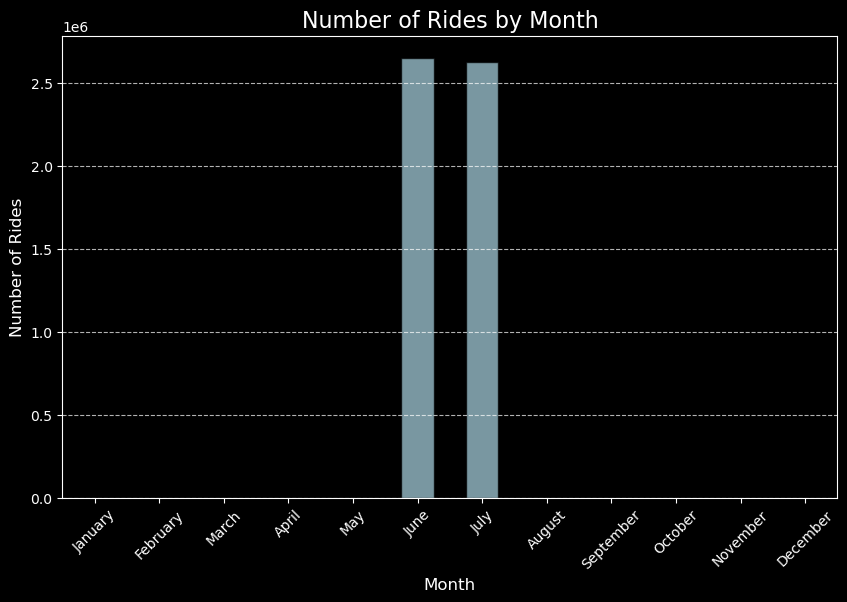

In [53]:
import pandas as pd

# Starting by grouping the data by month and count the number of rides.
# This gives the total ride counts for each month.
# Use the groupby() function to group the data in months. 
monthly_counts = combined_taxi_ta.groupby('month').size()

# Reorder the order of the months, into chronological order.
# Use the reindex () function to reorder the series according to the chronologically ordered list. 
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 
                'August', 'September', 'October', 'November', 'December']
monthly_counts = monthly_counts.reindex(months_order)

import matplotlib.pyplot as plt

# Compute the wanted size for the plot. 
plt.figure(figsize=(10, 6))

# Specify the plot, which in this case is a barplot. 
# Bar plot of rides for each month.
# Specify the data used: months (jan to dec)
# Use alpha for transparency.

monthly_counts.plot(
    kind='bar',
    color='lightblue',
    alpha=0.7,
    edgecolor='black')

# Compute labels and title for the barplot. 
# X-axis = month
# Y-axis = Number of rides by month
# Add horozontil gridlines, so the illustration is easier to visually analyze.
plt.title("Number of Rides by Month", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Number of Rides", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Now we can show the plot.
plt.show()


**Average fare by hour**

To analyze the relationship between temporal patterns and the variables fare and distance. The first step is calculating the average fare by hour. 

This is done by grouping the data by hour using the groupby() function

hour
0     14.820311
1     14.379942
2     13.669686
3     14.001505
4     17.105739
5     19.429116
6     15.776817
7     13.337309
8     12.324761
9     12.148284
10    12.097917
11    12.058888
12    12.361067
13    12.521999
14    12.952972
15    13.381780
16    13.675745
17    13.032382
18    12.371709
19    12.147304
20    12.521961
21    12.846075
22    13.421062
23    14.252887
Name: fare_amount, dtype: float64


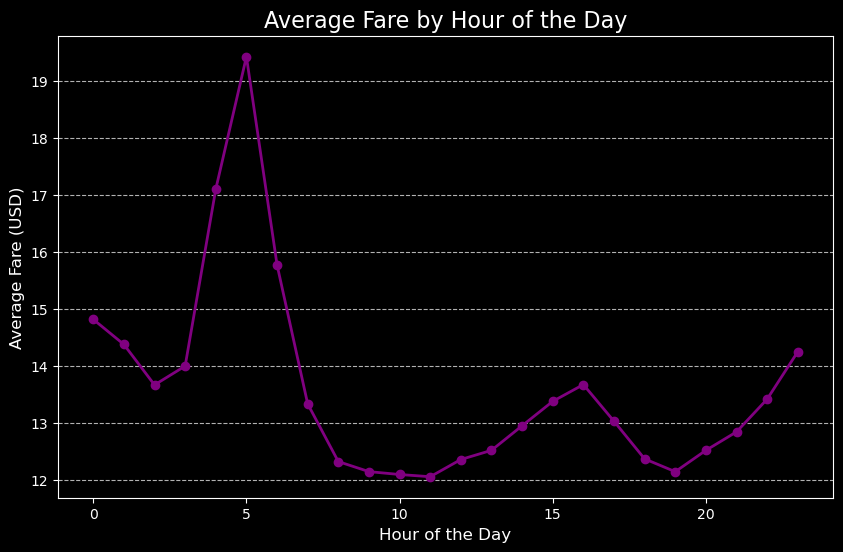

In [54]:

import pandas as pd


# Use the mean () function to calculate the average fare by hour.

Average_fare_by_hour = combined_taxi_ta.groupby('hour')['fare_amount'].mean()

# Printing the average fare by hour. 

print(Average_fare_by_hour)

import matplotlib.pyplot as plt

# Ploting the average fare by hour. 
# Start by defining the size of the plot. 
# Computing a line plot. 
# Compute the labels and title for the plot. 
# X-axis = Hour of the day
# Y-axis = Average Fare (USD)

plt.figure(figsize=(10, 6))
Average_fare_by_hour.plot(
    kind='line', 
    color='purple', 
    marker='o', 
    linestyle='-', 
    linewidth=2)

plt.title("Average Fare by Hour of the Day", fontsize=16)
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Average Fare (USD)", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Printing the plot
plt.show()

Line plot - Average fare by hour of the day.

A line plot is chosen to visualize the average fare by hour of the day, as it effectively represents variables influenced by other factors. In this case, the fare is affected by temporal patterns. The plot illustrates how the average fare (USD) varies throughout the day, showing a tendency for higher fares during early morning and late night hours. This is likely due to fewer trips covering longer distances, such as intercity travel or airport commutes, with a peak fare of $19.42 at 5 AM. After 10 AM, fares tend to decrease, potentially due to shorter commutes, reaching the lowest point at $12.05 at 11 AM. It is important to note that fare and trip distance have a direct correlation, as fares are primarily determined by trip distance—the longer the trip, the higher the fare

**Average fare by day of the week**

To calculating the average fare by day of the week to provide a broader perspective beyond the hourly fare analysis. The same approach used in the previous step is applied here.

day_of_week
Monday       13.017206
Tuesday      12.541698
Wednesday    12.610033
Thursday     13.023497
Friday       13.137514
Saturday     12.830070
Sunday       13.734895
Name: fare_amount, dtype: float64


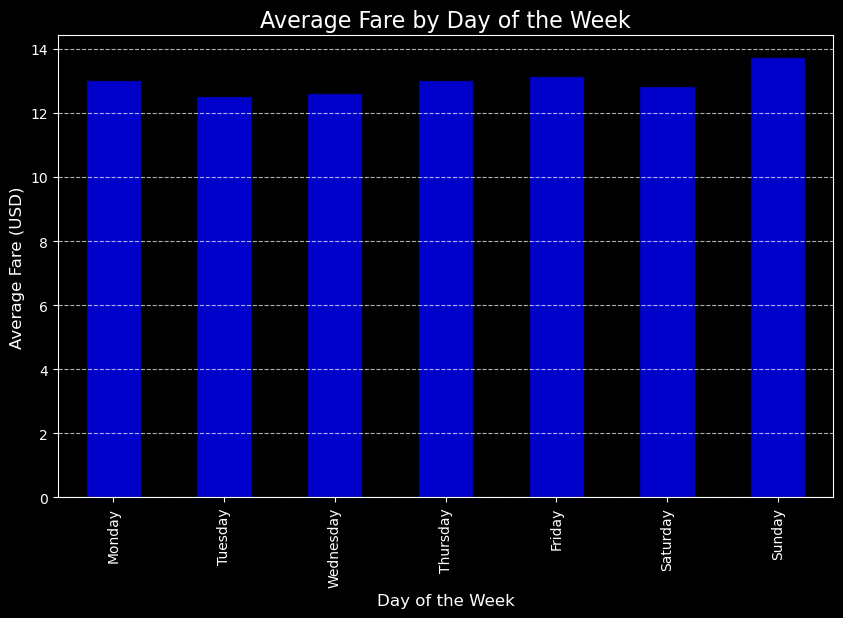

In [55]:
import pandas as pd


# Group the data by day of week and calculate the average fare by day of the week.
Average_fare_by_day = combined_taxi_ta.groupby('day_of_week')['fare_amount'].mean()

# Ensure the correct chronological order for the days.  
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
Average_fare_by_day = Average_fare_by_day.reindex(days_order)

# Print the list of average fare by day of the week.
print(Average_fare_by_day)

import matplotlib.pyplot as plt

# Plot the average fare by day of the week.  
# Define the plot size, type, color, and other visual properties.  
# Generate a bar plot to represent the data.  


plt.figure(figsize=(10, 6))
Average_fare_by_day.plot(
    kind='bar', 
    color='blue', 
    alpha=0.8, 
    edgecolor='black')

# Additionally, the labels and title is computed for the plot. 
# X-axis = Day of the week.
# Y-axis = Average Fare (USD)
plt.title("Average Fare by Day of the Week", fontsize=16)
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Average Fare (USD)", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the computed plot. 
plt.show()



Bar plot - Average fare by day of the week.

A bar plot is used for this analysis as it effectively highlights time periods that contribute more or less to the data. In this case, the goal is to determine which day of the week has a higher or lower average fare.

The plot shows that Sunday has the highest average fare ($13.73), possibly due to longer trips or lower taxi availability, as fewer people commute, leading to higher fares. From Monday to Friday, fares remain consistent, averaging between $12.50 and $13.10.

Despite being part of the weekend, Saturday has a lower average fare than Sunday, which could be due to shorter trips compared to Sunday’s longer-distance commutes. The data suggests that weekends involve longer distances, higher fares, and more leisure travel, while weekdays exhibit more consistent fare patterns driven by routine commuting.

**Average trip distance by day of the week**

By following the steps from the previous part, the average trip distance by the day of the week

day_of_week
Monday       3.294918
Tuesday      2.988167
Wednesday    2.970720
Thursday     3.032021
Friday       3.127345
Saturday     3.158463
Sunday       3.635458
Name: trip_distance, dtype: float64


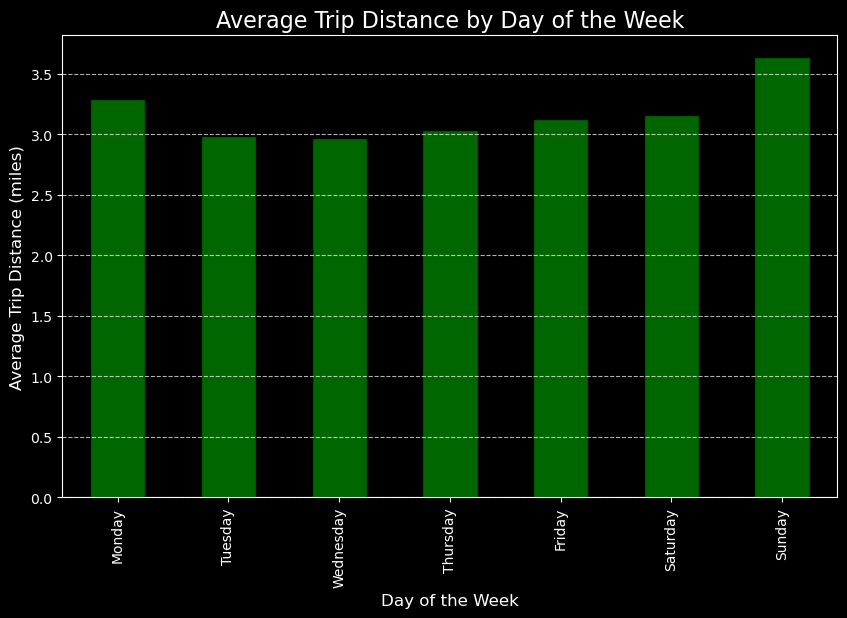

In [56]:
import pandas as pd

# Group the data by day of week and calculate the average trip distance.
Average_distance_by_day = combined_taxi_ta.groupby('day_of_week')['trip_distance'].mean()

# Make sure the days are in the right chronological order. 
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
Average_distance_by_day = Average_distance_by_day.reindex(days_order)

# Print the average trip distance by day of the week.
# This will give a list of each weekdays average trip distance.
print(Average_distance_by_day)

# Now, a plot is created for the average distance by day of the week.

import matplotlib.pyplot as plt

# Plotting the average trip distance by day of the week by defining the size of the bar plot. Labels and titles are added.
plt.figure(figsize=(10, 6))
Average_distance_by_day.plot(
    kind='bar', 
    color='green', 
    alpha=0.8, 
    edgecolor='black')

# X-axis = Day of the week
# Y-axis = Average Trip distance (miles)
plt.title("Average Trip Distance by Day of the Week", fontsize=16)
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Average Trip Distance (miles)", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Bar plot - Average trip distance by day of the week

The bar plot is used for effectively highlighting the time periods that contribute more or less to the data. In this case, the focus is on identifying which day of the week has a shorter or longer trip distance.

The plot shows that Sunday has the longest average trip distance (3.64 miles), which aligns with the previous analysis of average fare by day of the week. Tuesday and Wednesday have the shortest trip distances (2.97 miles), likely due to routine weekday commuting. Friday and Saturday show slightly higher trip distances (3.12 miles and 3.15 miles), reflecting a mix of weekday commuting and leisure travel.

These findings further emphasize the strong correlation between trip distance and fare.

**Average trip distance by hour of the day**

To calculate the average trip distance by hour of the day the previous steps are followed, where the average trip distance by day of the week was calculated. 
This is completed by grouping the data by hour and calculate the average trip distance.

hour
0     4.138644
1     4.017380
2     3.752206
3     3.858560
4     4.936384
5     5.876465
6     4.614686
7     3.593014
8     3.012796
9     2.878856
10    2.825451
11    2.753851
12    2.817864
13    2.875554
14    2.968466
15    3.073208
16    3.101749
17    2.934486
18    2.867873
19    2.969941
20    3.162865
21    3.328826
22    3.540360
23    3.865714
Name: trip_distance, dtype: float64


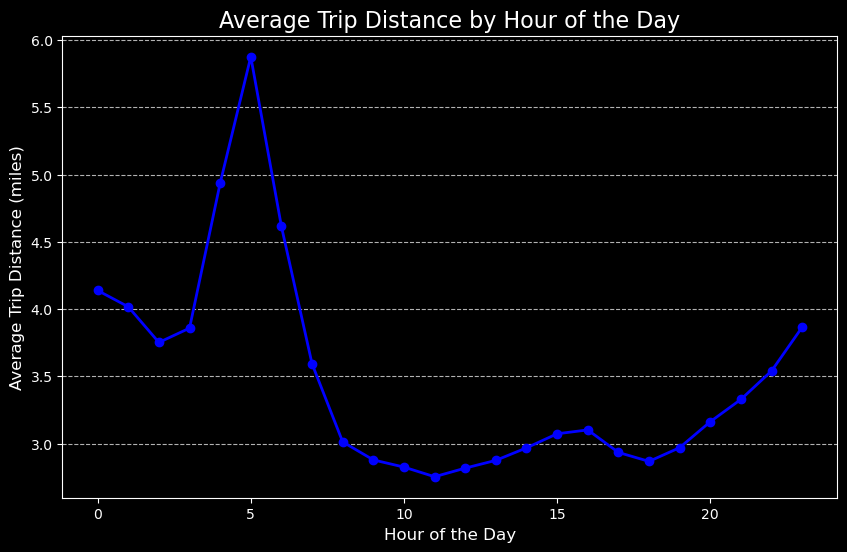

In [57]:
import pandas as pd

# Use the functions groupby (), and mean () for this step.
Average_distance_by_hour = combined_taxi_ta.groupby('hour')['trip_distance'].mean()

# Now print the calculated average trip distance for every hour.
print(Average_distance_by_hour)

# Make a plot for the average distance by hour of the day.

import matplotlib.pyplot as plt

# Now, plot the average trip distance by hour by defining the size of the plot by computing a line plot.
plt.figure(figsize=(10, 6))
Average_distance_by_hour.plot(
    kind='line', 
    color='blue', 
    marker='o', 
    linestyle='-', 
    linewidth=2)

# Add the labels and title for the plot. 
# X-axis = Hour of the day.
# Y-axis = Average Trip distance (miles)

plt.title("Average Trip Distance by Hour of the Day", fontsize=16)
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Average Trip Distance (miles)", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Line plot - Average trip distance by hour of the day.

The line plot is used to visualize the average trip distance by hour of the day, as it effectively captures variables influenced by other factors. In this case, trip distance is affected by temporal patterns.

The plot shows that 5 AM has the highest average trip distance (5.87 miles), likely reflecting long-distance trips such as airport rides that are more common in the early morning. The shortest distances are observed during busy commuting hours, with the lowest average (2.75 miles) at 11 AM. Late-night hours show an increase in trip distance, possibly due to leisure activities or longer trips.

#### Summary

Temporal analysis confirms a strong relationship between fare and trip distance. The price of taxi rides is largely determined by the distance traveled—longer distances result in higher fares. Another factor influencing fares is dynamic pricing, where demand fluctuations can impact the cost of a ride.

The temporal influence on taxi ride frequency is evident from the analysis. Weekdays exhibit stable fare and trip distance patterns due to routine and predictable commuting. In contrast, weekends and late-night hours show more variability, with longer trip distances often associated with leisure activities or airport trips.

A key trend observed is that early morning hours correspond to longer trip distances and higher fares. During weekday commuting hours, shorter trips and lower fares are more common, reflecting the nature of routine travel during peak periods.

#### Textbook Practice 

1 plot - Rides by hour of the day

For this plot, the tick labels are reduced to improve readability. While all 24 hours are displayed, labels are shown at three-hour intervals. The grid density is also adjusted from 0.7 to 0.5, making the gridlines more subtle for better visualization.

Color and marker adjustments enhance clarity, while data markers are retained in the line plot to provide relevant insights into ride trends for each hour. These refinements make the plot easier to interpret, allowing viewers to focus on key trends more effectively

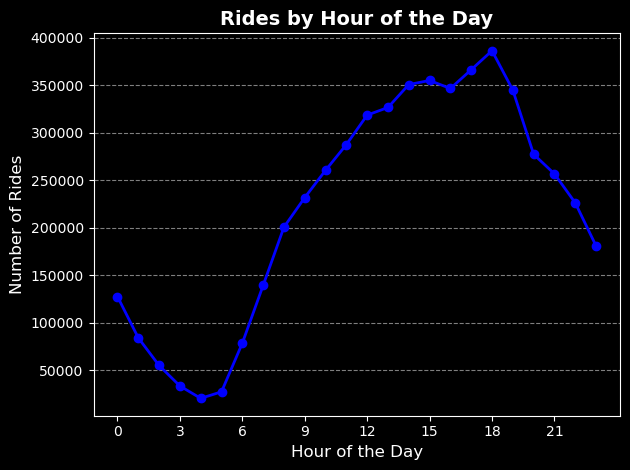

In [58]:
# plt.figure(figsize=(10, 6))
hourly_counts.plot(
    kind='line', 
    color='blue', 
    marker='o', 
    linestyle='-', 
    linewidth=2)

plt.title("Rides by Hour of the Day", fontsize=14, weight='bold')
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Number of Rides", fontsize=12)
plt.xticks(range(0, 24, 3), fontsize=10) 
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


2. plot - Rides by day of the week.

For this plot, the bar width is adjusted to make the bars slimmer for a cleaner appearance. The x-axis labels are rotated to prevent overlapping with numbers, ensuring better readability.

Subtle colors are used, and the gridlines are made transparent to keep the viewer's focus on the ride counts. Royal blue is chosen over bright blue to create a more visually balanced and subtle color scheme.

These adjustments make the plot clearer and more manageable for viewers, ensuring that the visualization remains simple and easy to understand without unnecessary distractions.


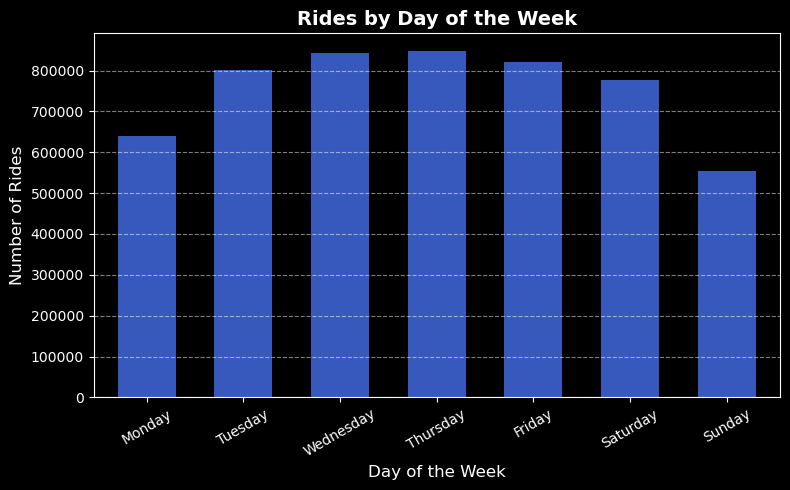

In [59]:
plt.figure(figsize=(8, 5))
rides_by_day.plot(
    kind='bar', 
    color='royalblue', 
    alpha=0.85, 
    width=0.6)
plt.title("Rides by Day of the Week", fontsize=14, weight='bold')
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Number of Rides", fontsize=12)
plt.xticks(fontsize=10, rotation=30)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

3. plot - Rides by hour and day of the week 

For this plot, the bar width is adjusted to create cleaner spacing, improving readability. The tick frequency is reduced, displaying labels every third hour instead of every hour, while still showing all 24 hours of the day. This adjustment makes the plot less cluttered without losing important details.

Subtle gridlines are added to help viewers trace data points more easily to the axis. A cleaner legend is implemented, and the title font is made bold for better readability. These refinements create a more streamlined and manageable visualization.

<Figure size 1200x600 with 0 Axes>

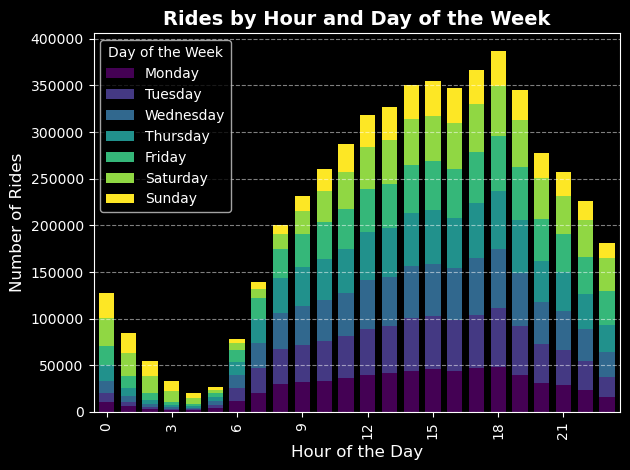

In [60]:
# To enhance clarity, the tight_layout() function is used, making the plot more compact and visually organized, 
# ensuring a less confusing presentation.

plt.figure(figsize=(12, 6))
rides_by_hour_day.plot(
    kind='bar', 
    stacked=True, 
    colormap='viridis', 
    width=0.7)

plt.title("Rides by Hour and Day of the Week", fontsize=14, weight='bold')
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Number of Rides", fontsize=12)
plt.xticks(range(0, 24, 3), fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title='Day of the Week', fontsize=10, loc='upper left') 
plt.tight_layout()
plt.show()


4. plot - Average fare by hour of the day.

For this plot, the tick frequency is reduced to display labels every third hour while still covering all 24 hours. The transparency of the gridlines is adjusted from 0.7 to 0.5, making them more subtle and preventing the plot from appearing overly complex.

The title is made bold for clearer readability, and a tight layout is applied to ensure a compact and visually simple presentation. These refinements enhance the plot’s clarity, making it easier for the audience to interpret.

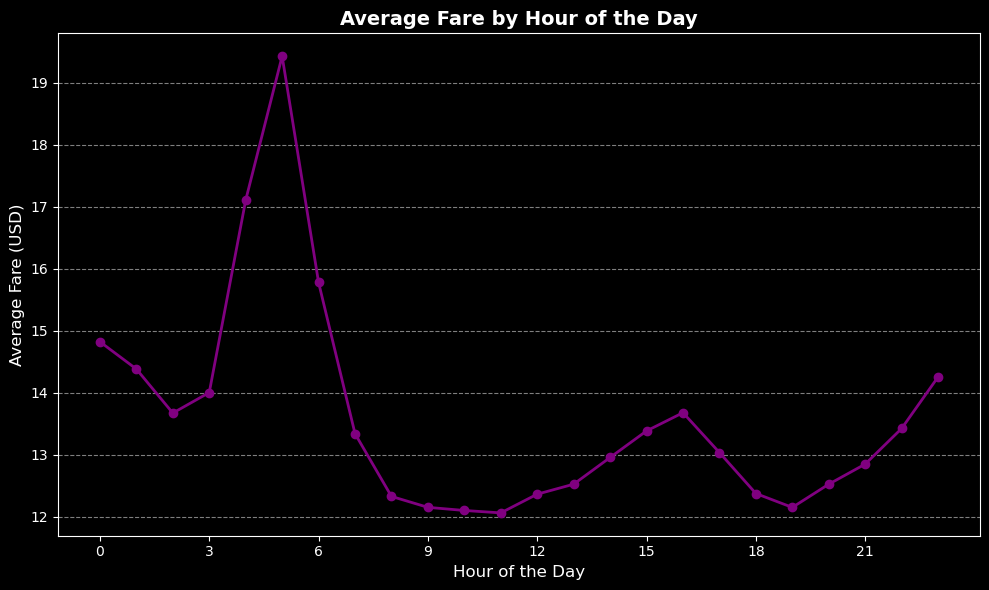

In [61]:
plt.figure(figsize=(10, 6))
Average_fare_by_hour.plot(
    kind='line', 
    color='purple', 
    marker='o', 
    linestyle='-', 
    linewidth=2)

plt.title("Average Fare by Hour of the Day", fontsize=14, weight='bold')
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Average Fare (USD)", fontsize=12)
plt.xticks(range(0, 24, 3), fontsize=10) 
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


5. plot - Average fare by day of the week.

The color is changed from bright blue to royal blue, creating a more muted and visually balanced appearance. Muted colors help make the plot easier to read without unnecessary distractions.

The bar width is adjusted for better readability, and the edge color is removed to simplify the design and reduce visual clutter. Subtle gridlines are applied to prevent confusion while maintaining reference points.

A tight layout is used once again to ensure a more compact and streamlined presentation, making the plot clearer and easier to interpret

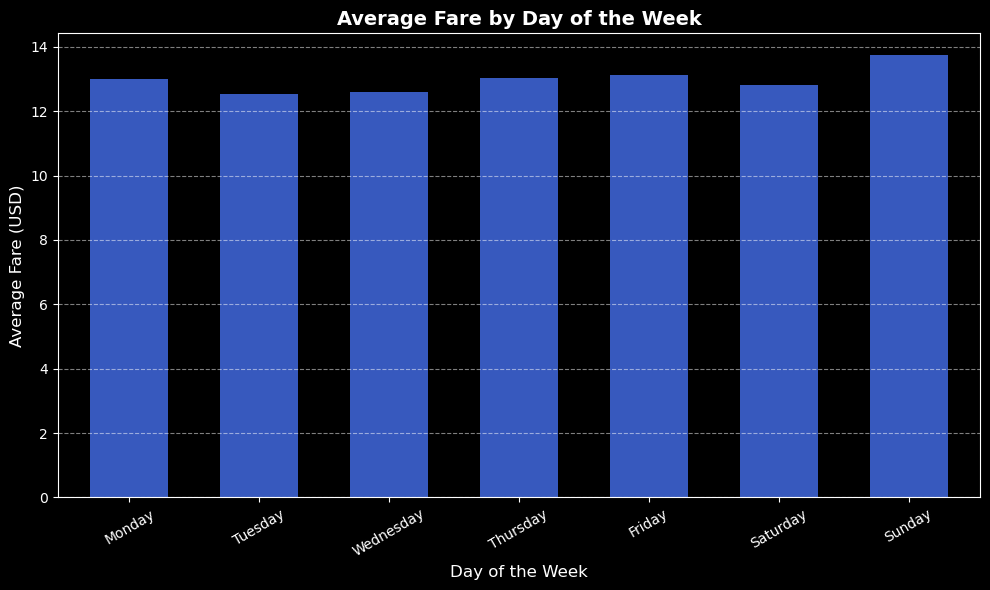

In [62]:
 plt.figure(figsize=(10, 6))
Average_fare_by_day.plot(
    kind='bar', 
    color='royalblue', 
    alpha=0.85, 
    width=0.6)

plt.title("Average Fare by Day of the Week", fontsize=14, weight='bold')
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Average Fare (USD)", fontsize=12)
plt.xticks(fontsize=10, rotation=30)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


6. plot - Average trip distance by day of the week

The width of the bars is adjusted to make them slimmer, reducing the space they occupy in the plot. The bar color is changed from green to light green, creating a more muted and visually appealing look. This adjustment makes the plot less overwhelming for the audience.

The title is made bold to enhance readability, while subtle gridlines are applied to maintain clarity without distraction. A tight layout is used to ensure a compact and well-organized presentation, keeping the focus on the data

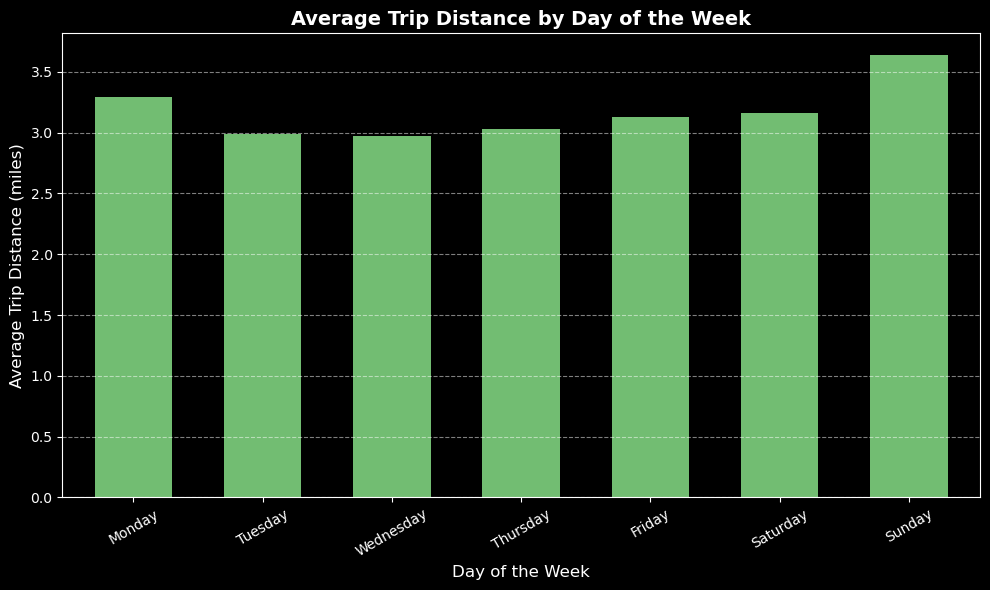

In [63]:
plt.figure(figsize=(10, 6))
Average_distance_by_day.plot(
    kind='bar', 
    color='lightgreen', 
    alpha=0.80, 
    width=0.6)

plt.title("Average Trip Distance by Day of the Week", fontsize=14, weight='bold')
plt.xlabel("Day of the Week", fontsize=12)
plt.ylabel("Average Trip Distance (miles)", fontsize=12)
plt.xticks(fontsize=10, rotation=30)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


7. plot - Average trip distance by hour of the day

To simplify the plot, the title font is made bold, ensuring it stands out and is easier to read. The tick frequency is adjusted to display labels every third hour instead of every hour while still covering all 24 hours. This helps reduce visual clutter and makes the plot more readable.

The transparency of the gridlines is adjusted from 0.7 to 0.5, making them more subtle and preventing unnecessary distractions for the audience. A tight layout is applied to create a more compact and structured visualization, making analysis clearer and more efficient.

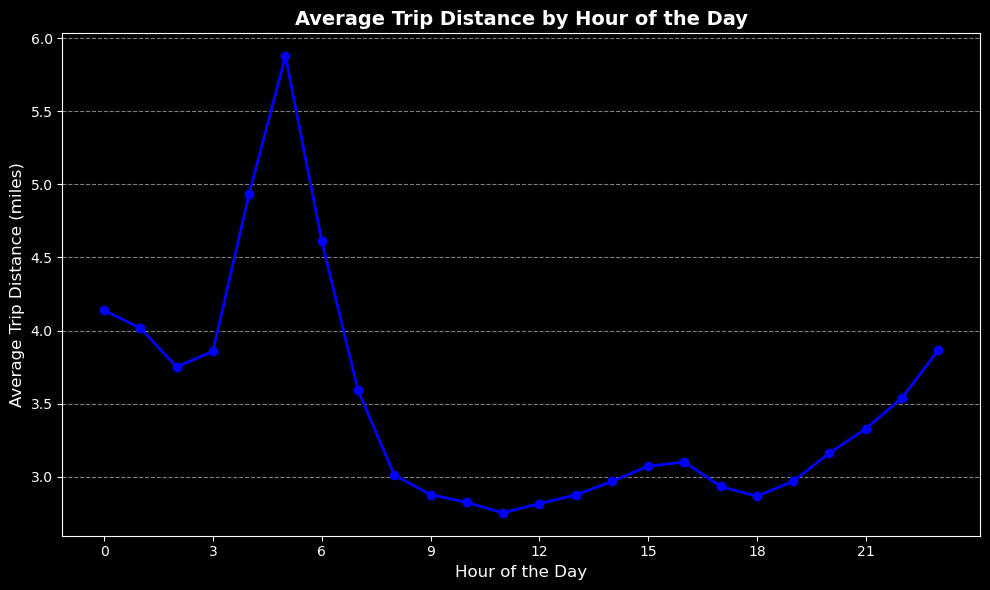

In [64]:
plt.figure(figsize=(10, 6))
Average_distance_by_hour.plot(
    kind='line', 
    color='blue', 
    marker='o', 
    linestyle='-', 
    linewidth=2)

plt.title("Average Trip Distance by Hour of the Day", fontsize=14, weight='bold')
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Average Trip Distance (miles)", fontsize=12)
plt.xticks(range(0, 24, 3), fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Task 5: Time-Series Forecasting
This task focuses on forecasting taxi ride demand for green and yellow taxis using Prophet. The model will be tuned, evaluated with MAE, RMSE, and MAPE, and analyzed for key trends. Time-based data splitting ensures accuracy, and visualizations will aid in interpreting the results.

In [65]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


**Downloading of packages**

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Install the prophet package
%pip install prophet

from prophet import Prophet

Note: you may need to restart the kernel to use updated packages.


**Loading of data**

The codes below loads and explores two datasets containing green and yellow taxi ride data. 

It reads the cleaned CSV files using pandas, displays the column names, and prints the first few rows of each dataset. This helps in understanding the structure and content of the data before proceeding with analysis or forecasting.

In [67]:
import pandas as pd

# Load Green Taxi Data
file_path_green = "cleaned_green_taxi_data.csv"  
green_data = pd.read_csv(file_path_green)

# Load Yellow Taxi Data
file_path_yellow = "cleaned_yellow_taxi_data.csv"  
yellow_data = pd.read_csv(file_path_yellow)

# Display first few rows of each dataset
print("Green Taxi Data Columns:")
print(green_data.columns.tolist())  # Print column names
print(green_data.head())  # Show first few rows

print("\nYellow Taxi Data Columns:")
print(yellow_data.columns.tolist())  # Print column names
print(yellow_data.head())  # Show first few rows


Green Taxi Data Columns:
['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime', 'store_and_fwd_flag', 'RatecodeID', 'PULocationID', 'DOLocationID', 'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'ehail_fee', 'improvement_surcharge', 'total_amount', 'payment_type', 'trip_type', 'congestion_surcharge', 'LocationID_x', 'Borough_x', 'Zone_x', 'service_zone_x', 'LocationID_y', 'Borough_y', 'Zone_y', 'service_zone_y', 'LocationID_trip', 'Borough_trip', 'Zone_trip', 'service_zone_trip', 'LocationID_zone', 'Borough_zone', 'Zone_zone', 'service_zone_zone', 'LocationID', 'Borough', 'Zone', 'service_zone']
   VendorID lpep_pickup_datetime lpep_dropoff_datetime store_and_fwd_flag  \
0         2  2021-06-01 00:31:19   2021-06-01 00:42:14                  N   
1         2  2021-06-01 00:16:07   2021-06-01 00:24:13                  N   
2         1  2021-06-01 00:03:58   2021-06-01 00:21:20                  N   
3         2  2021-06-01 00:0

In [68]:
# Loading the data for yellow
yellow_data = pd.read_csv(file_path_yellow)

# Print column names and first few rows to confirm
print("\nYellow Taxi Data Columns:")
print(yellow_data.columns.tolist())  # Print column names
print(yellow_data.head())  # Show first few rows



Yellow Taxi Data Columns:
['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime', 'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'congestion_surcharge', 'airport_fee', 'LocationID_x', 'Borough_x', 'Zone_x', 'service_zone_x', 'LocationID_y', 'Borough_y', 'Zone_y', 'service_zone_y', 'LocationID_trip', 'Borough_trip', 'Zone_trip', 'service_zone_trip', 'LocationID_zone', 'Borough_zone', 'Zone_zone', 'service_zone_zone', 'LocationID', 'Borough', 'Zone', 'service_zone']
   VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0         1  2021-06-01 00:13:26   2021-06-01 00:17:14              1.0   
1         1  2021-06-01 00:32:23   2021-06-01 01:07:04              1.0   
2         2  2021-06-01 00:31:01   2021-06-01 00:52:27              1.0   
3         1  2021-06-01 00:20:05   2021-06-01

The codes processes green and yellow taxi datasets for time-series forecasting. 

It first inspects dataset shapes and column names, then renames the pickup timestamp column to "ds" for consistency. The timestamps are converted to datetime format, and the data is aggregated by pickup time to count the number of rides per timestamp. The cleaned data is then displayed for further analysis.

In [69]:
# Prints the shape of the yellow taxi dataset and lists the column names for both the green and yellow taxi datasets
print(f"Yellow Taxi Data Shape: {yellow_data.shape}")
print("Green Taxi Columns:", green_data.columns.tolist())
print("Yellow Taxi Columns:", yellow_data.columns.tolist())

Yellow Taxi Data Shape: (5184801, 39)
Green Taxi Columns: ['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime', 'store_and_fwd_flag', 'RatecodeID', 'PULocationID', 'DOLocationID', 'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'ehail_fee', 'improvement_surcharge', 'total_amount', 'payment_type', 'trip_type', 'congestion_surcharge', 'LocationID_x', 'Borough_x', 'Zone_x', 'service_zone_x', 'LocationID_y', 'Borough_y', 'Zone_y', 'service_zone_y', 'LocationID_trip', 'Borough_trip', 'Zone_trip', 'service_zone_trip', 'LocationID_zone', 'Borough_zone', 'Zone_zone', 'service_zone_zone', 'LocationID', 'Borough', 'Zone', 'service_zone']
Yellow Taxi Columns: ['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime', 'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amo

In [70]:
# Correct column names based on dataset inspection
green_datetime_column = "lpep_pickup_datetime"  # Green taxi pickup timestamp
yellow_datetime_column = "tpep_pickup_datetime"  # Yellow taxi pickup timestamp

# Prepare Green Taxi Data
green_data.rename(columns={green_datetime_column: "ds"}, inplace=True)  # Rename date column
green_data["ds"] = pd.to_datetime(green_data["ds"])  # Convert to datetime
green_data = green_data.groupby("ds").size().reset_index(name="y")  

# Prepare Yellow Taxi Data
yellow_data.rename(columns={yellow_datetime_column: "ds"}, inplace=True)  # Rename date column
yellow_data["ds"] = pd.to_datetime(yellow_data["ds"])  # Convert to datetime
yellow_data = yellow_data.groupby("ds").size().reset_index(name="y")  # Keep "y"

# Display cleaned data for green and yellow taxis
print("\nProcessed Green Taxi Data:")
print(green_data.head())

print("\nProcessed Yellow Taxi Data:")
print(yellow_data.head())



Processed Green Taxi Data:
                   ds  y
0 2008-12-31 23:12:53  1
1 2009-01-01 00:13:47  1
2 2009-01-01 00:17:19  1
3 2009-01-01 01:03:17  1
4 2021-05-31 23:10:43  1

Processed Yellow Taxi Data:
                   ds  y
0 2004-04-04 04:08:30  1
1 2008-12-31 22:09:02  1
2 2008-12-31 22:59:12  1
3 2008-12-31 23:04:21  1
4 2008-12-31 23:04:50  1


**Reduce dataset for Prophet**

Due to the large dataset size, loading the entire data for Prophet caused performance issues. To address this, the dataset has been reduced to the last 1,000 rows for both green and yellow taxis. The optimized Prophet model is then trained on this subset, with specified seasonal and change-point settings. The model forecasts taxi demand for the next 30 days, and the results, including confidence intervals, are displayed for analysis.

In [71]:
import pandas as pd
from prophet import Prophet

# Reduce dataset size (keep last 1000 rows)
green_data = green_data.tail(1000)
yellow_data = yellow_data.tail(1000)

# Optimize Prophet model settings
model_green = Prophet(n_changepoints=5, yearly_seasonality=5, daily_seasonality=False)
model_yellow = Prophet(n_changepoints=5, yearly_seasonality=5, daily_seasonality=False)

# Fit models (smaller data = faster processing)
model_green.fit(green_data)
model_yellow.fit(yellow_data)

# Create future dataframe (predict next 30 days)
future_green = model_green.make_future_dataframe(periods=30)
future_yellow = model_yellow.make_future_dataframe(periods=30)

# Make predictions
forecast_green = model_green.predict(future_green)
forecast_yellow = model_yellow.predict(future_yellow)

# Display results
print("\nGreen Taxi Forecast:")
print(forecast_green[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())

print("\nYellow Taxi Forecast:")
print(forecast_yellow[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())


09:53:24 - cmdstanpy - INFO - Chain [1] start processing
09:53:24 - cmdstanpy - INFO - Chain [1] done processing
09:53:24 - cmdstanpy - INFO - Chain [1] start processing
09:53:24 - cmdstanpy - INFO - Chain [1] done processing



Green Taxi Forecast:
                   ds      yhat  yhat_lower  yhat_upper
0 2021-07-31 12:13:57  1.024742    0.860946    1.213965
1 2021-07-31 12:14:59  1.024726    0.844001    1.204502
2 2021-07-31 12:17:11  1.024693    0.840892    1.213221
3 2021-07-31 12:17:12  1.024693    0.830855    1.213379
4 2021-07-31 12:17:45  1.024684    0.853055    1.189311

Yellow Taxi Forecast:
                   ds      yhat  yhat_lower  yhat_upper
0 2021-07-31 23:35:02  1.576685    0.551983    2.544988
1 2021-07-31 23:35:03  1.576665    0.562705    2.629818
2 2021-07-31 23:35:04  1.576645    0.560706    2.557800
3 2021-07-31 23:35:05  1.576625    0.600653    2.526628
4 2021-07-31 23:35:06  1.576605    0.662498    2.612089


In [72]:
# Define test_green and test_yellow before using them
test_green = green_data.tail(90)  # Use last 90 days for testing
test_yellow = yellow_data.tail(90)

# Limit forecast period correctly
future_days = min(max(len(test_green), len(test_yellow)), 90)  # Cap at 90 days

# Generate future dataframe with correct period length
future_green = model_green.make_future_dataframe(periods=future_days)
future_yellow = model_yellow.make_future_dataframe(periods=future_days)

# Make predictions
forecast_green = model_green.predict(future_green)
forecast_yellow = model_yellow.predict(future_yellow)

# Now filter correctly
predicted_green = forecast_green[forecast_green["ds"].isin(test_green["ds"])]["yhat"].values
predicted_yellow = forecast_yellow[forecast_yellow["ds"].isin(test_yellow["ds"])]["yhat"].values

# Check if filtering worked
print("Green Predictions Found:", len(predicted_green))
print("Yellow Predictions Found:", len(predicted_yellow))



Green Predictions Found: 90
Yellow Predictions Found: 90


In [73]:
# Check if test dates exist in forecast
print("Test Green DS Range:", test_green["ds"].min(), "to", test_green["ds"].max())
print("Forecast Green DS Range:", forecast_green["ds"].min(), "to", forecast_green["ds"].max())

# Ensure test dates match forecast dates exactly
print("Matching Green DS Count:", forecast_green["ds"].isin(test_green["ds"]).sum())
print("Matching Yellow DS Count:", forecast_yellow["ds"].isin(test_yellow["ds"]).sum())


Test Green DS Range: 2021-07-31 22:22:17 to 2021-08-01 00:06:03
Forecast Green DS Range: 2021-07-31 12:13:57 to 2021-10-30 00:06:03
Matching Green DS Count: 90
Matching Yellow DS Count: 90


#### Visualization

For visualization, we followed key design principles to ensure clarity. A line plot was chosen to highlight trends, with color-coded lines distinguishing actual vs. predicted values. Clutter was minimized, confidence intervals were added, and axes were clearly labeled to enhance readability.

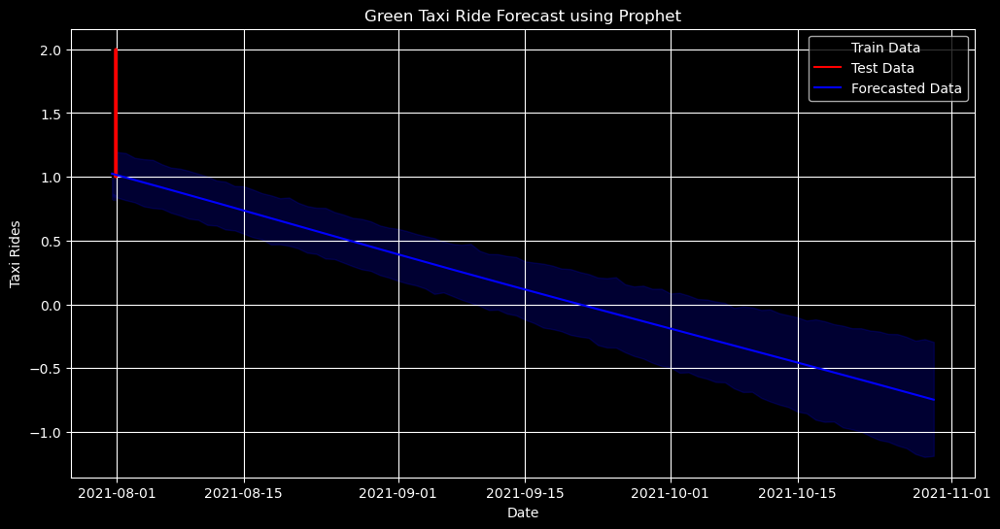

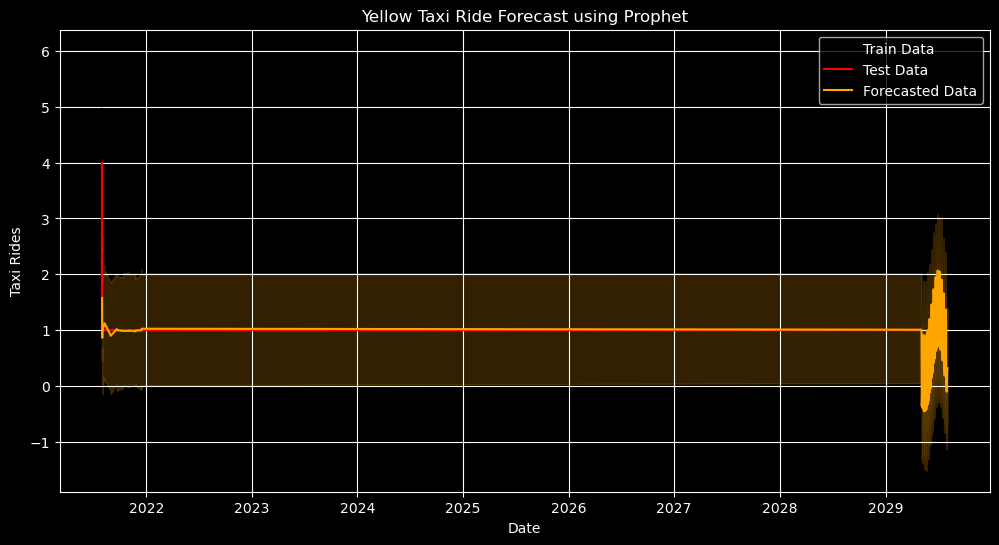

In [74]:
# Split the data into training and testing sets
train_size = int(len(green_data) * 0.8)  # Use 80% of the data for training

train_green = green_data.iloc[:train_size]  # Training data
test_green = green_data.iloc[train_size:]  # Test data

train_yellow = yellow_data.iloc[:train_size]  # Training data
test_yellow = yellow_data.iloc[train_size:]  # Test data

# Plot Green Taxi Forecast
plt.figure(figsize=(12,6))
plt.plot(train_green['ds'], train_green['y'], label="Train Data", color="black", linestyle="dotted")
plt.plot(test_green['ds'], test_green['y'], label="Test Data", color="red")
plt.plot(forecast_green['ds'], forecast_green['yhat'], label="Forecasted Data", color="blue")
plt.fill_between(forecast_green['ds'], forecast_green['yhat_lower'], forecast_green['yhat_upper'], color='blue', alpha=0.2)
plt.xlabel("Date")
plt.ylabel("Taxi Rides")
plt.title("Green Taxi Ride Forecast using Prophet")
plt.legend()
plt.grid(True)
plt.show()

# Plot Yellow Taxi Forecast
plt.figure(figsize=(12,6))
plt.plot(train_yellow['ds'], train_yellow['y'], label="Train Data", color="black", linestyle="dotted")
plt.plot(test_yellow['ds'], test_yellow['y'], label="Test Data", color="red")
plt.plot(forecast_yellow['ds'], forecast_yellow['yhat'], label="Forecasted Data", color="orange")
plt.fill_between(forecast_yellow['ds'], forecast_yellow['yhat_lower'], forecast_yellow['yhat_upper'], color='orange', alpha=0.2)
plt.xlabel("Date")
plt.ylabel("Taxi Rides")
plt.title("Yellow Taxi Ride Forecast using Prophet")
plt.legend()
plt.grid(True)
plt.show()


The two graphs present forecasts of Green and Yellow Taxi Rides using the Prophet model. 

They illustrate past trends, actual test data, and predicted future values, providing insights into the expected trajectory of taxi rides over time.

**Green Taxi Ride Forecast**

The first graph displays the forecast for Green Taxi rides. The black dotted line represents the historical training data, while the red line represents the test data—actual observations excluded from the training process. The blue line shows the model’s forecast for future taxi rides, and the shaded blue area represents the uncertainty interval, which widens over time, indicating increased uncertainty in long-term predictions.

A notable trend in this forecast is the steady decline in predicted taxi rides. This suggests that historical data may indicate a decreasing demand for Green Taxis. However, the actual test data appears higher than the forecast, potentially signaling that the model does not fully capture external factors affecting taxi demand. Possible reasons for this discrepancy include seasonality, economic influences, or a need for better parameter tuning in the Prophet model.

**Yellow Taxi Ride Forecast**

The second graph illustrates the forecast for Yellow Taxi rides. Similar to the Green Taxi forecast, the black dotted line represents historical training data, the red line denotes test data, and the orange line shows predicted values. The shaded orange area represents the uncertainty interval.

A key observation in this graph is that the model predicts a flat trend for most of the forecast period. This suggests that the Prophet model has not detected significant upward or downward trends in the training data and has therefore projected a stable number of rides. However, the uncertainty interval is quite wide, especially toward the later years, reflecting high uncertainty in long-term predictions.

Interestingly, there is an unexpected increase in forecasted variability around 2029, which might indicate data anomalies or errors in how future data points were generated. This could be due to a limited dataset, a lack of strong trends in historical data, or issues with how the Prophet model interprets long-term patterns.

**Comparison and Insights**

Comparing both forecasts, it is evident that the Green Taxi rides exhibit a downward trend, while Yellow Taxi rides appear more stable with significant uncertainty. These differences could be attributed to distinct ridership patterns, business models, or market shifts affecting Green and Yellow Taxi services differently.

To improve forecast accuracy, further refinements should be considered:

1. Incorporate more data, ensuring seasonality and external factors are accounted for.
2. Fine-tune the Prophet model parameters, including adding holiday effects or other regressors.
3. Analyze anomalies, particularly in the Yellow Taxi forecast, where the unexpected rise in variance around 2029 suggests potential model misinterpretations.


#### Summary

Both forecasts provide valuable insights into the potential future of Green and Yellow Taxi rides, but they should not be taken as definitive predictions. Instead, they highlight trends that require further validation and refinement. With additional tuning and data adjustments, these models could serve as powerful tools for predicting taxi demand and supporting transportation planning decision

#### Visualization - Prophet model

11:12:26 - cmdstanpy - INFO - Chain [1] start processing
11:12:26 - cmdstanpy - INFO - Chain [1] done processing
11:12:26 - cmdstanpy - INFO - Chain [1] start processing
11:12:27 - cmdstanpy - INFO - Chain [1] done processing


Train Data Range: 2021-07-31 12:13:57 to 2021-07-31 20:39:19
Test Data Range: 2021-07-31 20:39:47 to 2021-08-01 00:06:03
Forecast Data Range: 2021-07-31 12:13:57 to 2021-08-30 20:39:19
Train Data Range: 2021-07-31 23:35:02 to 2021-07-31 23:55:50
Test Data Range: 2021-07-31 23:55:51 to 2029-05-05 08:37:39
Forecast Data Range: 2021-07-31 23:35:02 to 2029-06-03 23:55:50


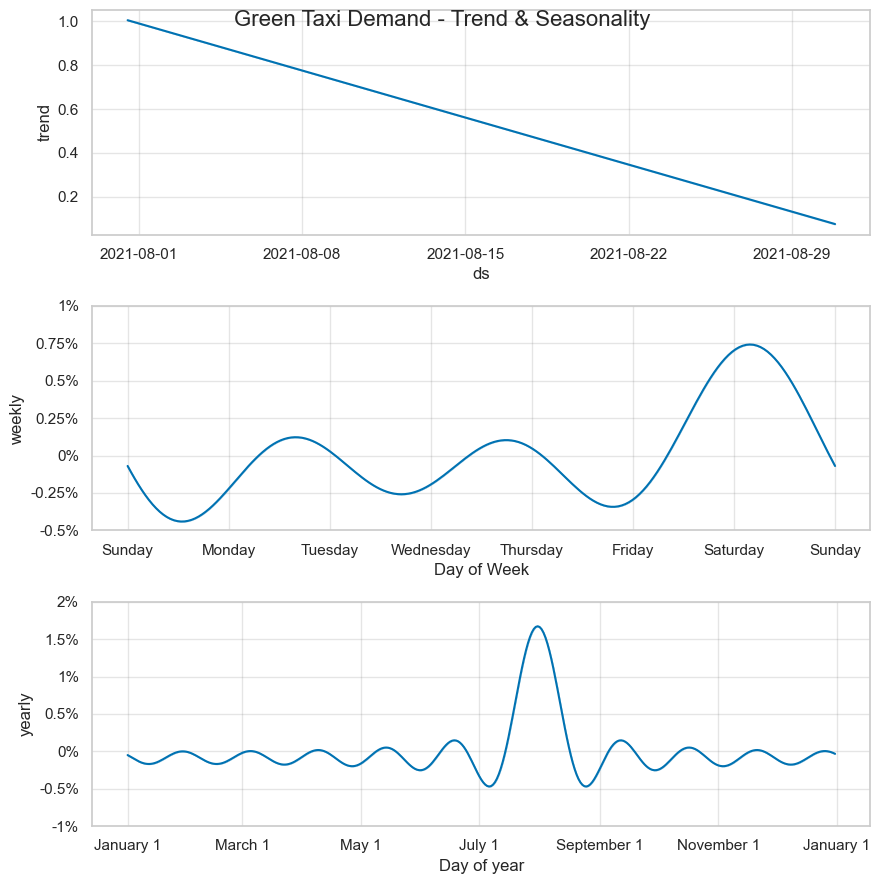

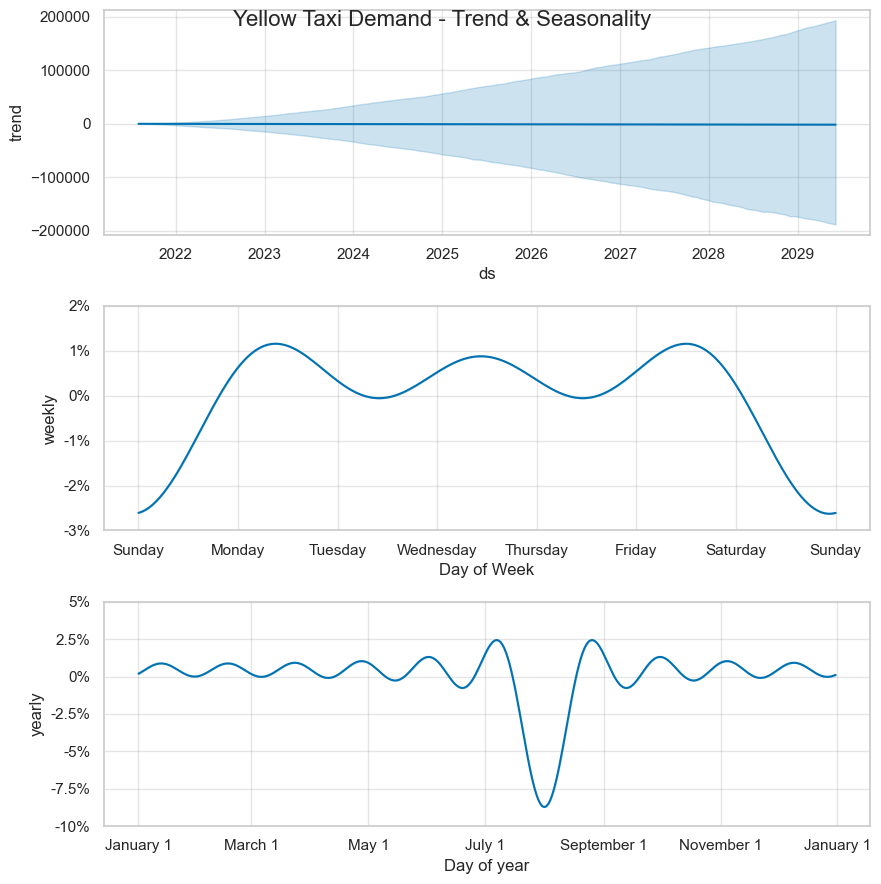

In [78]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Define improved Prophet model with tuning

def tune_and_evaluate(df, periods=30):
    """Train, tune and evaluate a Prophet model."""
    
    # Split data into training and testing
    train_size = int(len(df) * 0.8)
    train_df = df.iloc[:train_size]
    test_df = df.iloc[train_size:]
    
    # Optimize Prophet model parameters
    model = Prophet(
        changepoint_prior_scale=0.05,  # Controls flexibility
        seasonality_mode='multiplicative',  # Try 'additive' if data is more stable
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False
    )
    
    # Fit model
    model.fit(train_df)
    
    # Ensure future includes all test dates
    last_train_date = train_df['ds'].max()
    last_test_date = test_df['ds'].max()
    required_periods = (last_test_date - last_train_date).days + 30  # Ensure buffer for predictions
    future = model.make_future_dataframe(periods=required_periods, freq='D')
    
    # Predict
    forecast = model.predict(future)
    
    # Debugging: Print date ranges
    print(f"Train Data Range: {train_df['ds'].min()} to {train_df['ds'].max()}")
    print(f"Test Data Range: {test_df['ds'].min()} to {test_df['ds'].max()}")
    print(f"Forecast Data Range: {forecast['ds'].min()} to {forecast['ds'].max()}")
    
    # Check if test dates exist in forecast
    available_dates = forecast['ds'].isin(test_df['ds'])
    if available_dates.sum() == 0:
        print("Warning: No matching test dates found in forecast! Check your date range.")
        return model, forecast, None, None, None
    
    # Extract only forecasted values matching test set
    predicted = forecast[available_dates]['yhat'].values
    actual = test_df['y'].values
    
    # Compute error metrics
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100  # Percentage
    
    print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.2f}%")
    
    # Visualization: Residual Plot
    residuals = actual - predicted
    plt.figure(figsize=(12, 6))
    plt.plot(test_df['ds'], residuals, marker='o', linestyle='', color='red', alpha=0.5)
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel("Date")
    plt.ylabel("Residuals (Actual - Predicted)")
    plt.title("Residual Plot: Forecast Errors Over Time")
    plt.show()
    
    return model, forecast, mae, rmse, mape

# Apply to Green Taxi Data
green_model, green_forecast, green_mae, green_rmse, green_mape = tune_and_evaluate(green_data)

# Apply to Yellow Taxi Data
yellow_model, yellow_forecast, yellow_mae, yellow_rmse, yellow_mape = tune_and_evaluate(yellow_data)

# Performance Comparison Bar Chart
if green_mae is not None and yellow_mae is not None:
    labels = ['Green Taxi', 'Yellow Taxi']
    mae_values = [green_mae, yellow_mae]
    rmse_values = [green_rmse, yellow_rmse]
    mape_values = [green_mape, yellow_mape]

    x = np.arange(len(labels))
    width = 0.25

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.bar(x - width, mae_values, width, label='MAE')
    ax.bar(x, rmse_values, width, label='RMSE')
    ax.bar(x + width, mape_values, width, label='MAPE')

    ax.set_xlabel("Taxi Type")
    ax.set_ylabel("Error Metric Values")
    ax.set_title("Performance Comparison: Green vs. Yellow Taxi Forecasts")
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()
    plt.show()

# Prophet Component Plots with Titles
def plot_prophet_components(model, forecast, title):
    fig = model.plot_components(forecast)
    fig.suptitle(title, fontsize=16)
    plt.show()

plot_prophet_components(green_model, green_forecast, "Green Taxi Demand - Trend & Seasonality")
plot_prophet_components(yellow_model, yellow_forecast, "Yellow Taxi Demand - Trend & Seasonality")


The visualizations illustrate key trends and seasonal patterns in the demand for Green and Yellow taxis. These plots help in understanding long-term movements, weekly variations, and yearly seasonality.

**Trend Component**

**Green Taxi:** The trend shows a steady decline, suggesting a consistent decrease in demand over time. This could indicate a shift in consumer preferences, increased competition, or other external factors impacting ridership.

**Yellow Taxi:** The trend remains flat with an increasing uncertainty range over future years, meaning that the model does not detect a strong long-term increase or decrease in demand. This suggests that Yellow Taxi rides are relatively stable but unpredictable over the long term.

**Interpretation:**
A declining trend (Green Taxi) suggests a need for intervention, such as marketing strategies to regain demand.
A flat trend (Yellow Taxi) with high uncertainty suggests the need for further data sources to improve the model's predictive confidence.

**Weekly Seasonality Component**
Both Green and Yellow Taxis exhibit weekly fluctuations in demand.
Higher demand is observed on Fridays and Saturdays, likely due to increased commuting, social activities, and weekend travel.
Sundays experience a sharp decline, reflecting reduced commuting and lower passenger movement.

**Interpretation:**

Taxi services could optimize fleet distribution by increasing availability on high-demand days (Friday & Saturday).
Special fare discounts or promotions could be targeted at low-demand days (Sundays) to stimulate ridership.

**Yearly Seasonality Component**
Green Taxi: Displays a sharp increase in demand around September, possibly due to seasonal trends like the return of students or major events.
Yellow Taxi: Shows a notable drop in demand around September, indicating a seasonal reduction in taxi usage, possibly due to vacation periods or economic slowdowns.
Both models show smaller cyclical patterns throughout the year, likely influenced by weather, holidays, and tourism.

**Interpretation:**

Identifying seasonal peaks and troughs can help optimize pricing strategies and allocate resources effectively.
A sharp decline in demand during certain months suggests a need for marketing efforts or service adjustments to mitigate revenue losses.


#### Summary

The visualizations provide valuable insights into taxi demand trends and seasonality:
1. Green Taxis show a declining trend, whereas Yellow Taxis maintain a more stable demand pattern.
2. Demand is highest on Fridays and Saturdays, and lowest on Sundays.
3. Yearly seasonality patterns indicate key periods of increased and decreased demand for both taxi services.

By leveraging these insights, taxi services can strategically optimize operations, pricing, and marketing to improve ridership and revenue.